### Initialization Bock

In [1]:
#!pip install tensorflow==1.12.0

In [2]:
# Initialization
colab_run=False
anc_box= True
_grid_offset=True
train=False
test_mode=2
data_save=True
train_dir='VOC2007/'
test_dir='VOC2007_test/'
if colab_run==True:
  !pip install pydrive
  from pydrive.auth import GoogleAuth
  from pydrive.drive import GoogleDrive
  from google.colab import auth
  from oauth2client.client import GoogleCredentials

  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)

  import os, cv2
  from google.colab import drive
  drive.mount('/content/drive/')

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from matplotlib import pyplot as plt
import tensorflow.keras.backend as K
import tensorflow as tf
import numpy as np
import pickle
import os, cv2

#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

# %matplotlib inline


C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dty

### Configure Block

### Model Building Block

In [3]:
LABELS=['person', 'bird', 'cat', 'cow', 'dog', 'horse', 'sheep','aeroplane', 'bicycle',
         'boat', 'bus', 'car', 'motorbike', 'train', 'bottle', 'chair','diningtable',
         'pottedplant', 'sofa', 'tvmonitor']
f=open('coco.txt','r')
LABELS=[]
for line in f:
    line=line.split(':')
    LABELS.append(str(line[1][1:-1]))
f=open('D:/COCO/labels_coco','rb')
_LABELS=pickle.load(f)
f.close()
LABELS=list(_LABELS.values())

IMAGE_H, IMAGE_W = 608, 608
GRID_H,  GRID_W  = 19 , 19
BOX              = 5
CLASS            = len(LABELS)
CLASS_WEIGHTS    = np.ones(CLASS, dtype='float32')
OBJ_THRESHOLD    = 0.3#0.5
NMS_THRESHOLD    = 0.3#0.45
ANCHORS          = [0.57273, 0.677385, 1.87446, 2.06253, 3.33843, 5.47434, 7.88282, 3.52778, 9.77052, 9.16828]
#ANCHORS          = [1.3221, 1.73145, 3.19275, 4.00944, 5.05587, 8.09892, 9.47112, 4.84053, 11.2364, 10.0071]           
#ANCHORS          = [ 4.469053,2.148582,10.548851,5.381520,11.420664,9.961033,6.517299,3.699693,2.469196,1.599054]
#ANCHORS=[13,13]
#NO_OBJECT_SCALE  = 1.0
#OBJECT_SCALE     = 5.0
#COORD_SCALE      = 1.0
#CLASS_SCALE      = 1.0

BATCH_SIZE       = 10
WARM_UP_BATCHES  = 0
TRUE_BOX_BUFFER  = 50
lambda_coord=5.0
lambda_noobj=0.5

lr=1e-5
epochs=60
optimizer = Adam(lr=lr, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
#optimizer = SGD(lr=1e-4, decay=0.0005, momentum=0.9)
#optimizer = RMSprop(lr=1e-4, rho=0.9, epsilon=1e-08, decay=0.0)
exp_name='v-2.1/'
root='D:/'
path_wts=root+'yolov2.weights'
path_wts_final=root+exp_name+'best.hdf5'
if not os.path.exists(root+exp_name):
    os.mkdir(root+exp_name)

In [4]:
# the function to implement the orgnization layer (thanks to github.com/allanzelener/YAD2K)
def space_to_depth_x2(x):
    return tf.space_to_depth(x, block_size=2)

def build_model():
  input_image = Input(shape=(IMAGE_H, IMAGE_W, 3))
  true_boxes  = Input(shape=(1, 1, 1, TRUE_BOX_BUFFER , 4))

  # Layer 1
  x = Conv2D(32, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
  x = BatchNormalization(name='norm_1')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 2
  x = Conv2D(64, (3,3), strides=(1,1), padding='same', name='conv_2', use_bias=False)(x)
  x = BatchNormalization(name='norm_2')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 3
  x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_3', use_bias=False)(x)
  x = BatchNormalization(name='norm_3')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 4
  x = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_4', use_bias=False)(x)
  x = BatchNormalization(name='norm_4')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 5
  x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_5', use_bias=False)(x)
  x = BatchNormalization(name='norm_5')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 6
  x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
  x = BatchNormalization(name='norm_6')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 7
  x = Conv2D(128, (1,1), strides=(1,1), padding='same', name='conv_7', use_bias=False)(x)
  x = BatchNormalization(name='norm_7')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 8
  x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_8', use_bias=False)(x)
  x = BatchNormalization(name='norm_8')(x)
  x = LeakyReLU(alpha=0.1)(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 9
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_9', use_bias=False)(x)
  x = BatchNormalization(name='norm_9')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 10
  x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_10', use_bias=False)(x)
  x = BatchNormalization(name='norm_10')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 11
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_11', use_bias=False)(x)
  x = BatchNormalization(name='norm_11')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 12
  x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_12', use_bias=False)(x)
  x = BatchNormalization(name='norm_12')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 13
  x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_13', use_bias=False)(x)
  x = BatchNormalization(name='norm_13')(x)
  x = LeakyReLU(alpha=0.1)(x)

  skip_connection = x

  x = MaxPooling2D(pool_size=(2, 2))(x)

  # Layer 14
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_14', use_bias=False)(x)
  x = BatchNormalization(name='norm_14')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 15
  x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_15', use_bias=False)(x)
  x = BatchNormalization(name='norm_15')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 16
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_16', use_bias=False)(x)
  x = BatchNormalization(name='norm_16')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 17
  x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_17', use_bias=False)(x)
  x = BatchNormalization(name='norm_17')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 18
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_18', use_bias=False)(x)
  x = BatchNormalization(name='norm_18')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 19
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_19', use_bias=False)(x)
  x = BatchNormalization(name='norm_19')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 20
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_20', use_bias=False)(x)
  x = BatchNormalization(name='norm_20')(x)
  x = LeakyReLU(alpha=0.1)(x)

  # Layer 21
  skip_connection = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_21', use_bias=False)(skip_connection)
  skip_connection = BatchNormalization(name='norm_21')(skip_connection)
  skip_connection = LeakyReLU(alpha=0.1)(skip_connection)
  skip_connection = Lambda(space_to_depth_x2)(skip_connection)

  x = concatenate([skip_connection, x])

  # Layer 22
  x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_22', use_bias=False)(x)
  x = BatchNormalization(name='norm_22')(x)
  x = LeakyReLU(alpha=0.1)(x)

  if anc_box==True:
    # Layer 23
    x = Conv2D(BOX*(4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
    output = Reshape((GRID_H, GRID_W,BOX,4 + 1 + CLASS))(x)
  else :
    # Layer 23
    x = Conv2D((4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
    output = Reshape((GRID_H, GRID_W,4 + 1 + CLASS))(x)

  # small hack to allow true_boxes to be registered when Keras build the model 
  # for more information: https://github.com/fchollet/keras/issues/2790
  #output = Lambda(lambda args: args[0])([output, true_boxes])#Change :Hasib

  #model = Model([input_image, true_boxes], output)#Change :Hasib
  model = Model(input_image, output)
  return model
  #model.load_weights('/content/drive/My Drive/Data/yolo_net_ep500_act.h5')


class WeightReader:
    def __init__(self, weight_file):
        self.offset = 4
        self.all_weights = np.fromfile(weight_file, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]
    
    def reset(self):
        self.offset = 4

def load_weights(model,path_wst):
  wt_path = path_wts                      
  weight_reader = WeightReader(wt_path)
  weight_reader.reset()
  nb_conv = 23

  for i in range(1, nb_conv+1):
      conv_layer = model.get_layer('conv_' + str(i))

      if i < nb_conv:
          norm_layer = model.get_layer('norm_' + str(i))

          size = np.prod(norm_layer.get_weights()[0].shape)

          beta  = weight_reader.read_bytes(size)
          gamma = weight_reader.read_bytes(size)
          mean  = weight_reader.read_bytes(size)
          var   = weight_reader.read_bytes(size)

          weights = norm_layer.set_weights([gamma, beta, mean, var])       

      if len(conv_layer.get_weights()) > 1:
          bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
          kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
          kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
          kernel = kernel.transpose([2,3,1,0])
          conv_layer.set_weights([kernel, bias])
      else:
          kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
          kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
          kernel = kernel.transpose([2,3,1,0])
          conv_layer.set_weights([kernel])
  return model



def yolo_loss_1(y_true, y_pred):
      loss=0
          ### adjust w and h
      obj_mask_ex= tf.expand_dims(y_true[..., 4], axis=-1)
      obj_mask= y_true[..., 4]
      #conf_obj_mask=y_true[...,4]
      noobj_mask=np.abs(y_true[...,4]-1)
      
      if anc_box==True and _grid_offset==True:
        _x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))#1,13,13,1,1
        _y = tf.transpose(_x, (0,2,1,3,4))#1,13,13,1,1
        _grid = tf.tile(tf.concat([_x,_y], -1), [BATCH_SIZE, 1, 1, 5, 1])#10,13,13,5,1

        pred_xy = tf.sigmoid(y_pred[..., :2]) + _grid
        pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
        
      if anc_box==False and _grid_offset==True:
        _x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1)))#1,13,13,1,1
        _y = tf.transpose(_x, (0,2,1,3))#1,13,13,1
        _grid = tf.tile(tf.concat([_x,_y], -1), [BATCH_SIZE, 1, 1, 1])#10,13,13,1

        pred_xy = tf.sigmoid(y_pred[..., :2]) + _grid
        pred_wh = y_pred[..., 2:4]# * np.reshape(ANCHORS, [1,1,1,BOX,2])
        #pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
      
      if _grid_offset==False:
        pred_xy=y_pred[...,0:2] #+ cell_grid # if cell_grid Batch_Gen center_x -=grid_x
        pred_wh=y_pred[...,2:4]
      

      true_xy=y_true[...,0:2]
      true_wh=y_true[...,2:4]
      pred_conf=y_pred[...,4]
      ### adjust confidence
      true_wh_half = true_wh / 2.
      true_mins    = tf.subtract(true_xy,true_wh_half)
      true_maxes   = tf.add(true_xy,true_wh_half)
    
      pred_wh_half = pred_wh / 2.
      pred_mins    = tf.subtract(pred_xy,pred_wh_half)
      pred_maxes   = tf.add(pred_xy,pred_wh_half)       
    
      intersect_mins  = tf.maximum(pred_mins,  true_mins)
      intersect_maxes = tf.minimum(pred_maxes, true_maxes)
      intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
      intersect_areas = tf.multiply(intersect_wh[..., 0] , intersect_wh[..., 1])
    
      true_areas = tf.multiply(true_wh[..., 0] , true_wh[..., 1])
      pred_areas = tf.multiply(pred_wh[..., 0] , pred_wh[..., 1])

      union_areas =tf.subtract(tf.add(pred_areas,true_areas),intersect_areas)
      intersect_areas=tf.add(intersect_areas,1)
      union_areas=tf.add(union_areas,1)
      iou_scores  = tf.truediv(intersect_areas, union_areas)
      true_box_class = tf.argmax(y_true[..., 5:], -1)
      pred_box_class=y_pred[..., 4]
      pred_box_class = y_pred[..., 5:]
      class_mask = y_true[..., 4] * tf.gather(CLASS_WEIGHTS, true_box_class)
    
      #class_mask = y_true[..., 4] * tf.to_float(true_box_class)
      nb_class_box = tf.reduce_sum(tf.to_float(class_mask > 0.0))
      true_conf =tf.multiply( iou_scores,y_true[..., 4])
      
      loss_bb=tf.subtract(true_xy,pred_xy)
      loss_bb=tf.square(loss_bb)
      loss_bb=tf.multiply(loss_bb,obj_mask_ex)
      loss_bb=tf.reduce_sum(loss_bb)
    
      pred_wh_abs=tf.abs(pred_wh)
      pred_wh_abs=tf.where(tf.equal(pred_wh_abs,0),tf.ones_like(pred_wh_abs),pred_wh_abs)
      pred_wh_sign=tf.truediv(pred_wh,pred_wh_abs)
      loss_wh=tf.subtract(tf.sqrt(true_wh),tf.multiply(pred_wh_sign,tf.sqrt(pred_wh_abs)))
      loss_wh=tf.square(loss_wh)
      loss_wh=tf.multiply(loss_wh,obj_mask_ex)
      loss_wh=tf.reduce_sum(loss_wh)
    
      loss_conf=tf.subtract(true_conf,pred_conf)
      loss_conf=tf.square(loss_conf)
      loss_conf=tf.multiply(loss_conf,obj_mask)
      loss_conf=tf.reduce_sum(loss_conf)
    
      loss_noobj_conf=tf.subtract(true_conf,pred_conf)
      loss_noobj_conf=tf.square(loss_noobj_conf)
      loss_noobj_conf=tf.multiply(loss_noobj_conf,noobj_mask)
      loss_noobj_conf=tf.reduce_sum(loss_noobj_conf)
    
      loss_class = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=true_box_class, logits=pred_box_class)
      loss_class = tf.reduce_sum(loss_class * class_mask) / (nb_class_box + 1e-6)
      loss=lambda_coord*loss_bb+lambda_coord*loss_wh+loss_conf+lambda_noobj*loss_noobj_conf+loss_class       
      return loss


### Data Ready Block

In [5]:
if colab_run==True :data_dir='/content/drive/My Drive/CNN_Basic/'
else: data_dir=''
from xml.etree import ElementTree as ET

def read_content(xml_file,_dir):
    objs=[]
    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []
    filename = root.find('filename').text
    size=root.find('size')
    img_h=int(size.find('height').text)
    img_w=int(size.find('width').text)
    for boxes in root.iter('object'):
        
        name = boxes.find('name').text
        ymin, xmin, ymax, xmax = None, None, None, None
        
        for box in boxes.findall("bndbox"):
            ymin = int(box.find("ymin").text)
            xmin = int(box.find("xmin").text)
            ymax = int(box.find("ymax").text)
            xmax = int(box.find("xmax").text)
        wf=IMAGE_W/img_w
        hf=IMAGE_H/img_h
        obj={'name':name,
          'xmin':xmin*wf,
          'ymin':ymin*hf,
          'xmax':xmax*wf,
          'ymax':ymax*hf}
        objs.append(obj)
        
    out={
          'filename':_dir+'JPEGImages/'+filename,
          'height':img_h,
          'width':img_w,
          'object':objs
    }
        
    return filename, list_with_all_boxes,out

def IOU(bboxes1, bboxes2):
        #import pdb;pdb.set_trace()
        x1_min, y1_min, x1_max, y1_max = list(bboxes1)
        x2_min, y2_min, x2_max, y2_max = list(bboxes2)
        xA = np.maximum(x1_min, x2_min)
        yA = np.maximum(y1_min, y2_min)
        xB = np.minimum(x1_max, x2_max)
        yB = np.minimum(y1_max, y2_max)
        interArea = np.maximum((xB - xA ), 0) * np.maximum((yB - yA ), 0)
        boxAArea = (x1_max - x1_min ) * (y1_max - y1_min )
        boxBArea = (x2_max - x2_min ) * (y2_max - y2_min )
        iou = interArea / (boxAArea + boxBArea - interArea)
        return iou
    
def Batch_Gen(all_data,no_of_batch):
      while(True):
            N=len(all_data)
            _batch_size=N//no_of_batch

            for _ind in range(no_of_batch):

                batch=all_data[_ind*_batch_size:(_ind+1)*_batch_size]
                n=len(batch)
                x_batch = np.zeros((n,IMAGE_H, IMAGE_W,3),dtype=np.float32)                         # input images
                if anc_box==True:
                  y_batch = np.zeros((n, GRID_H, GRID_W,BOX,4+1+len(LABELS)),dtype=np.float)                # desired network output
                else :
                  y_batch = np.zeros((n, GRID_H, GRID_W,4+1+len(LABELS)),dtype=np.float)                # desired network output
                instance_count=0

                
                for sample in batch:

                        image_name = sample['filename']
                        img = cv2.imread(image_name)
                        img = cv2.resize(img, (IMAGE_H,IMAGE_W))
                        img = img[:,:,::-1]
                        img_w=sample['height']
                        img_h=sample['width']
                        all_objs = sample['object']
                        # construct output from object's x, y, w, h
                        true_box_index = 0
                        anchors = [[0, 0, ANCHORS[2*i], ANCHORS[2*i+1]] for i in range(int(len(ANCHORS)//2))]
                        for obj in all_objs:
                            
                            if obj['xmax'] > obj['xmin'] and obj['ymax'] > obj['ymin'] and obj['name'] in LABELS:
                                center_x = .5*(obj['xmin'] + obj['xmax'])
                                center_x = center_x*GRID_W
                                center_y = .5*(obj['ymin'] + obj['ymax'])
                                center_y=center_y*GRID_H
                                grid_x = int(np.floor(center_x))
                                grid_y = int(np.floor(center_y))
                                if _grid_offset==False:
                                            center_x-=grid_x
                                            center_y-=grid_y
                                #center_x-=grid_x
                                #center_y-=grid_y
                                if grid_x < GRID_W and grid_y < GRID_H:
                                    obj_indx  = LABELS.index(obj['name'])
                                    center_w = (obj['xmax'] - obj['xmin'])*GRID_W #/ (float(self.config['IMAGE_W'])# / self.config['GRID_W']) # unit: grid cell
                                    center_h = (obj['ymax'] - obj['ymin'])*GRID_H #/ (float(self.config['IMAGE_H'])# / self.config['GRID_H']) # unit: grid cell
                                    center_w=center_w
                                    center_h=center_h

                                    box = [center_x, center_y, center_w, center_h]

                                    # find the anchor that best predicts this box#Change :Hasib
                                    best_anchor = -1
                                    max_iou     = -1

                                    shifted_box = [0, 0, center_w, center_h]

                                    for i in range(len(anchors)):
                                        anchor = anchors[i]
                                        iou    = IOU(shifted_box, anchor)

                                        if max_iou < iou:
                                            best_anchor = i
                                            max_iou     = iou

                                    # assign ground truth x, y, w, h, confidence and class probs to y_batch
                                    if anc_box==True:
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,0:4] = box
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,4  ] = 1.
                                      y_batch[instance_count, grid_y, grid_x, best_anchor,5+obj_indx] = 1
                                    else :
                                      y_batch[instance_count, grid_y, grid_x,0:4] = box
                                      y_batch[instance_count, grid_y, grid_x,4  ] = 1.
                                      y_batch[instance_count, grid_y, grid_x,5+obj_indx] = 1

                                    # assign the true box to b_batch
                                    #b_batch[instance_count, 0, 0, 0, true_box_index] = box#Change: Hasib

                                    #true_box_index += 1
                                    #true_box_index = true_box_index % self.config['TRUE_BOX_BUFFER']

                        # assign input image to x_batch
                        x_batch[instance_count] = img/255

                        # increase instance counter in current batch
                        instance_count += 1  

                        #print(' new batch created', idx)
                yield (x_batch, y_batch)




### Reading Data

In [6]:
import glob
import cv2
import pandas as pd
import pickle

f=open('D:/COCO/train_coco_dfs','rb')
train_data=pickle.load(f)
f.close()
f=open('D:/COCO/train_coco_dfs','rb')
test_data=pickle.load(f)
f.close()
f=open('D:/COCO/train_coco_dfs','rb')
valid_data=pickle.load(f)
f.close()

In [7]:
import numpy as np



if train==True or train==False:
  
  #train_imgs=all_data[:n_train]
  valid_data=test_data
  N=len(train_data)
  n_train=len(train_data)
  n_valid=len(valid_data)
  train_batch=[]
  valid_batch=[]
  no_of_tr_batch=int(np.floor(n_train/BATCH_SIZE))
  train_batch=Batch_Gen(train_data,no_of_tr_batch)
  no_of_val_batch=int(np.floor(n_valid/BATCH_SIZE))
  valid_batch=Batch_Gen(valid_data,no_of_val_batch)

In [8]:
name=[]
class_wt=pd.Series([0]*len(LABELS),index=LABELS)
for sample in train_data:  
    names=[obj['name'] for obj in sample['object']] 
    for label in names:
        class_wt[label]+=1
class_weights=class_wt.sum()-class_wt#.values
class_weights=class_weights/class_weights.max()
#CLASS_WEIGHTS=np.array(class_weights.values,dtype=np.float32)

person 000000002532.jpg
skis 000000002532.jpg


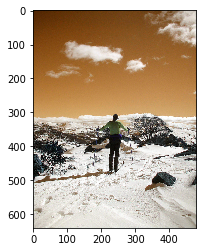

banana 000000002587.jpg
donut 000000002587.jpg


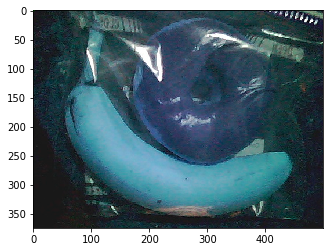

dining table 000000002592.jpg
cup 000000002592.jpg
knife 000000002592.jpg


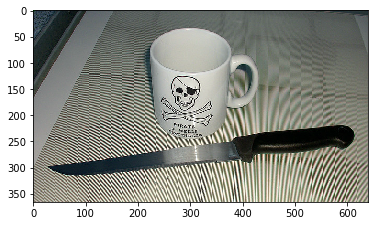

bottle 000000002685.jpg
bottle 000000002685.jpg
bottle 000000002685.jpg
bottle 000000002685.jpg
bottle 000000002685.jpg
bottle 000000002685.jpg
bottle 000000002685.jpg
person 000000002685.jpg
person 000000002685.jpg
person 000000002685.jpg
person 000000002685.jpg
bottle 000000002685.jpg
wine glass 000000002685.jpg
cup 000000002685.jpg
person 000000002685.jpg
handbag 000000002685.jpg
wine glass 000000002685.jpg
cup 000000002685.jpg
person 000000002685.jpg


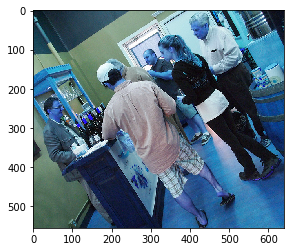

bird 000000002923.jpg
bird 000000002923.jpg
bird 000000002923.jpg
boat 000000002923.jpg
boat 000000002923.jpg
boat 000000002923.jpg
boat 000000002923.jpg


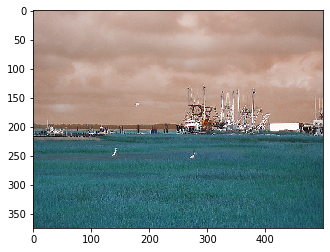

person 000000003156.jpg
sink 000000003156.jpg
toilet 000000003156.jpg


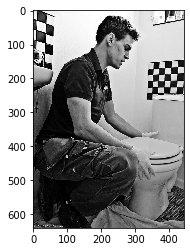

person 000000003255.jpg
person 000000003255.jpg
person 000000003255.jpg
person 000000003255.jpg
skis 000000003255.jpg
backpack 000000003255.jpg
backpack 000000003255.jpg
person 000000003255.jpg
backpack 000000003255.jpg
person 000000003255.jpg


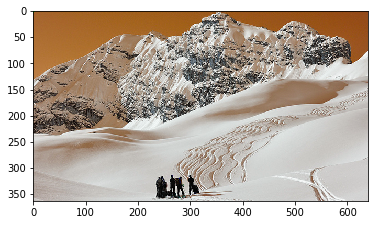

broccoli 000000003501.jpg
broccoli 000000003501.jpg
bowl 000000003501.jpg


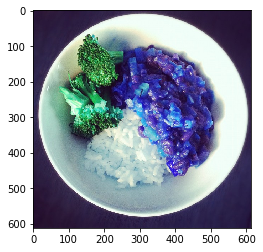

person 000000003553.jpg
skateboard 000000003553.jpg


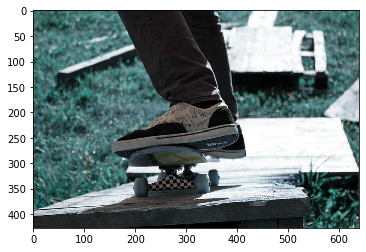

banana 000000003661.jpg
keyboard 000000003661.jpg
cup 000000003661.jpg


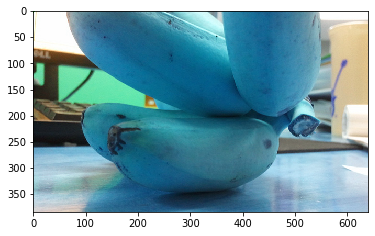

dining table 000000003845.jpg
cup 000000003845.jpg
fork 000000003845.jpg
broccoli 000000003845.jpg
broccoli 000000003845.jpg
broccoli 000000003845.jpg
carrot 000000003845.jpg
carrot 000000003845.jpg
carrot 000000003845.jpg
carrot 000000003845.jpg
spoon 000000003845.jpg
carrot 000000003845.jpg


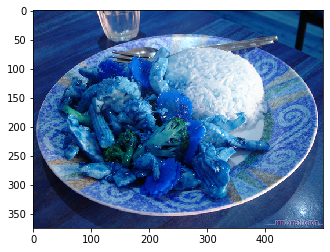

couch 000000003934.jpg
person 000000003934.jpg
person 000000003934.jpg
person 000000003934.jpg
cup 000000003934.jpg
remote 000000003934.jpg
remote 000000003934.jpg
person 000000003934.jpg
person 000000003934.jpg
wine glass 000000003934.jpg
wine glass 000000003934.jpg
wine glass 000000003934.jpg
person 000000003934.jpg
person 000000003934.jpg


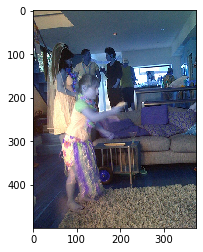

tie 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
wine glass 000000004134.jpg
wine glass 000000004134.jpg
wine glass 000000004134.jpg
dining table 000000004134.jpg
person 000000004134.jpg
tie 000000004134.jpg
tie 000000004134.jpg
wine glass 000000004134.jpg
chair 000000004134.jpg
chair 000000004134.jpg
person 000000004134.jpg
person 000000004134.jpg
chair 000000004134.jpg
dining table 000000004134.jpg
person 000000004134.jpg
dining table 000000004134.jpg


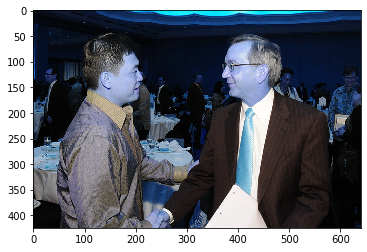

tie 000000004395.jpg
person 000000004395.jpg


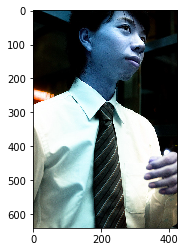

tv 000000004495.jpg
couch 000000004495.jpg
chair 000000004495.jpg


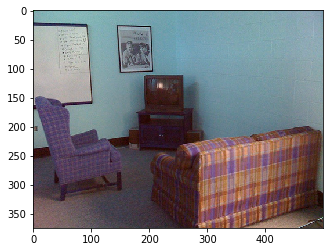

person 000000004765.jpg
surfboard 000000004765.jpg


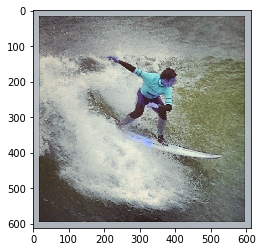

cat 000000004795.jpg
laptop 000000004795.jpg
tv 000000004795.jpg


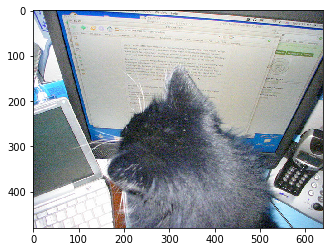

scissors 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
person 000000005001.jpg
handbag 000000005001.jpg
bicycle 000000005001.jpg
person 000000005001.jpg
scissors 000000005001.jpg


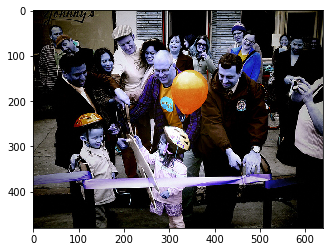

bus 000000005037.jpg
car 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
person 000000005037.jpg
car 000000005037.jpg


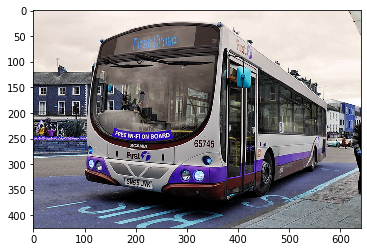

cell phone 000000005060.jpg
person 000000005060.jpg


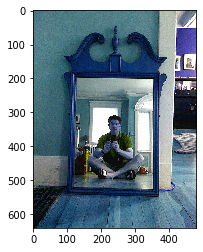

person 000000005193.jpg
person 000000005193.jpg
person 000000005193.jpg
person 000000005193.jpg
person 000000005193.jpg
surfboard 000000005193.jpg
surfboard 000000005193.jpg
bottle 000000005193.jpg
person 000000005193.jpg


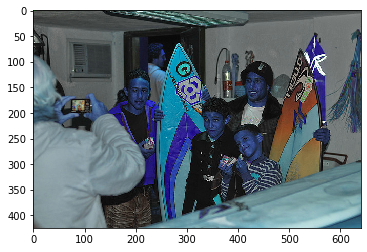

airplane 000000005477.jpg
airplane 000000005477.jpg


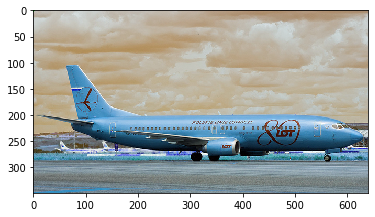

toilet 000000005503.jpg


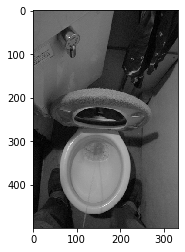

person 000000005529.jpg
skis 000000005529.jpg


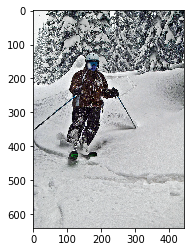

person 000000005586.jpg
person 000000005586.jpg
tennis racket 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg
person 000000005586.jpg


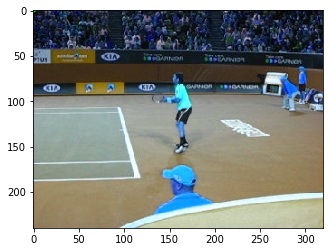

spoon 000000005600.jpg
bowl 000000005600.jpg
bowl 000000005600.jpg


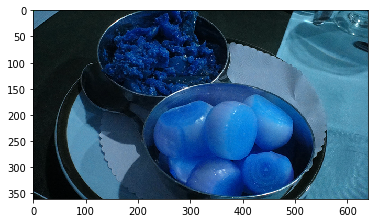

sheep 000000005992.jpg
sheep 000000005992.jpg
sheep 000000005992.jpg
sheep 000000005992.jpg
sheep 000000005992.jpg


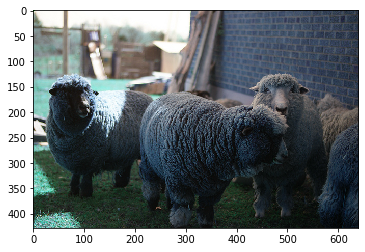

banana 000000006012.jpg
banana 000000006012.jpg


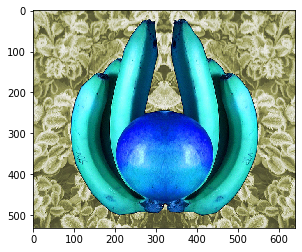

train 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
car 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
person 000000006040.jpg
truck 000000006040.jpg


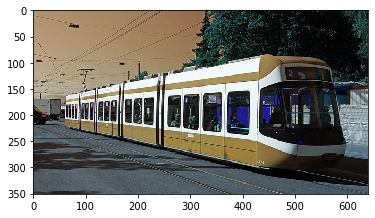

sink 000000006213.jpg
sink 000000006213.jpg


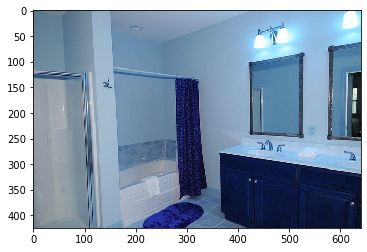

In [9]:
for i in range(30,60):
    image_h=(test_data[i]['height']/IMAGE_H)
    image_w=(test_data[i]['width']/IMAGE_W)
    img=cv2.imread('D:/COCO/val2017/'+test_data[i]['filename'])
    for obj in test_data[i]['object']:
        print(obj['name'],test_data[i]['filename'])
        xmin,ymin,xmax,ymax=list(obj.values())[1:]
        cv2.rectangle(img, (int(xmin*image_w),int(ymin*image_h)), (int(xmax*image_w),int(ymax*image_h)), (0,255,0), 3)
    plt.imshow(img)
    plt.show()

In [10]:
image_h=(test_data[i]['height']/416)
test_data[i]['height']/416

1.0216346153846154

data_check=True
if data_check==True:
    sampleX,sampleY=next(train_batch)
    plt.imshow(sampleX[3])
    plt.show()
    img=sampleY[3][...,3,11+5]
    plt.imshow(img)
    plt.show()
    for i in range(4,5):
        print('index',i)
        plt.imshow(sampleY[3][...,3,i]*10)
        plt.show()

### Train Block

In [11]:
model=build_model()
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 608, 608, 3)  0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 608, 608, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 608, 608, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 608, 608, 32) 0           norm_1[0][0]                     
__________________________________________________________________________________________________
max_poolin

In [12]:
for layer in model.layers[-31:]:
        print(layer)

In [13]:


def train_model(model):
  #filepath="D:/"+exp_name+"weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5"
  filepath=root+exp_name+"best.hdf5"
  checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
  callbacks_list = [checkpoint]
  model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  if anc_box==True:
    model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  history=model.fit_generator(train_batch,
                              steps_per_epoch=no_of_tr_batch,
                              epochs=epochs,
                              callbacks=callbacks_list,
                              validation_data=valid_batch,
                              validation_steps=no_of_val_batch)

  
  return model,history


In [14]:
if train==True:
    model=load_weights(model,path_wts)
    for layer in model.layers[:-31]:
        layer.trainable=False
    model,history=train_model(model)
    
    
    plt.plot(history.history['acc'])
    plt.plot(history.history['loss'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    
    # summarize history for loss
    plt.plot(range(5,epochs),history.history['loss'][5:])
    plt.plot(range(5,epochs),history.history['val_loss'][5:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='upper left')
    plt.savefig(root+exp_name+'yolo-v1_exp.png')
    plt.show()
    

    f=open(root+exp_name+'history:_ep_70_v-1.0_exp','wb')
    pickle.dump([history.history['loss'],history.history['val_loss']],f)
    f.close()
    val_loss=np.array(history.history['val_loss'])
    best_epoch=np.argmin(val_loss) 
    print(best_epoch,val_loss[best_epoch])
if test_mode==1:
    model.load_weights(path_wts_final)
if test_mode==2:
    model=load_weights(model,path_wts)

### Predicion Block

In [15]:
def _softmax(x, axis=-1, t=-100.):
    x = x - np.max(x)
    
    if np.min(x) < t:
        x = x/np.min(x)*t
        
    e_x = np.exp(x)
    
    return e_x / e_x.sum(axis, keepdims=True)

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def nmax_supp(boxes):
    df=pd.DataFrame(boxes,columns=['x','y','w','h','conf','_class'])
    sdf=df.sort_values('conf',ascending=False).reset_index(drop=True)
    #print(sdf)
    for ind1 in range(len(sdf)-1):
        box1=sdf.loc[ind1,['x','y','w','h']].values
        b1_class=sdf.loc[ind1,['_class']].values
        for ind2 in range(ind1+1,len(sdf)):
            b2_class=sdf.loc[ind2,['_class']].values
            b2_conf=sdf.loc[ind2,['conf']].values
            if b2_class==b1_class and b2_conf>0.0:
                 box2=sdf.loc[ind2,['x','y','w','h']].values
                 if b1_class==b2_class and IOU(box1,box2)>=0.1:
                    sdf.loc[ind2,'conf']=0.0
    ndf=sdf[sdf.conf>0.0]
    return list(ndf.values)#[:len(ndf.values)//2]

def decode_netout_anc(netout, anchors, nb_class, obj_threshold=0.3, nms_threshold=0.3):
    #grid_h, grid_w, nb_box = netout.shape[:3]
    grid_h, grid_w = netout.shape[:2]
    
    boxes = []
    # decode the output by the network
    netout[..., 4]  = _sigmoid(netout[..., 4])
    netout[..., 5:] = netout[..., 4][..., np.newaxis] * _softmax(netout[..., 5:])
    netout[..., 5:] *= netout[..., 5:] > obj_threshold

    for row in range(grid_h):
        for col in range(grid_w):
            for b in range(BOX):
                # from 4th element onwards are confidence and class classes
                classes = netout[row,col,b,5:]
                #classes = netout[row,col,5:]
                confidence = netout[row,col,b,4]
                if np.sum(classes) > 0:
                    x, y, w, h = netout[row,col,b,:4]
                    x = (col + _sigmoid(x)) / grid_w # center position, unit: image width
                    y = (row + _sigmoid(y)) / grid_h # center position, unit: image height
                    w = ANCHORS[2 * b + 0] * np.exp(w) / grid_w # unit: image width
                    h = ANCHORS[2 * b + 1] * np.exp(h) / grid_h # unit: image height
                    #print(x,y,w,h)
                    classes=np.argmax(classes)
                    
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, classes)
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, classes)
                    boxes.append(box)   
    f_boxes=nmax_supp(boxes)
    return f_boxes    

def decode_netout_1(netout, anchors, nb_class, obj_threshold=0.3, nms_threshold=0.3):
    #grid_h, grid_w, nb_box = netout.shape[:3]
    grid_h, grid_w = netout.shape[:2]
    boxes = []
    
    # decode the output by the network
    netout[..., 4]  = _sigmoid(netout[..., 4])
    netout[..., 5:] = netout[..., 4][..., np.newaxis] * _softmax(netout[..., 5:])
    netout[..., 5:] *= netout[..., 5:] > obj_threshold
    class_prob_log=[0]*CLASS
    #boxes=[(0,)*6]*CLASS
    boxes=[]
    for row in range(grid_h):
        for col in range(grid_w):
            #for b in range(BOX):
                # from 4th element onwards are confidence and class classes
                classes = netout[row,col,5:]
                #classes = netout[row,col,5:]
                confidence = netout[row,col,4]
                if np.sum(classes) > 0:
                    # first 4 elements are x, y, w, and h
                    #x, y, w, h = netout[row,col,b,:4]
                    x, y, w, h = netout[row,col,:4]
                    #print(col,_sigmoid(x-col),row,_sigmoid(y),w,h)
                    w_ratio=(IMAGE_W/GRID_W)/IMAGE_W
                    h_ratio=(IMAGE_W/GRID_W)/IMAGE_H
                    x = (col+_sigmoid(x))*(h_ratio)#x*(32/416) # center position, unit: image width
                    y = (row+_sigmoid(y))*(w_ratio)#y*(32/416) # center position, unit: image height
                    w = w*(w_ratio) # unit: image width
                    h = h*(h_ratio) # unit: image height
                    #print(x,y,w,h)
                    class_ind=np.argmax(classes)
                    #if class_prob_log[class_ind]< classes[class_ind]:       
                    class_prob_log[class_ind]=classes[class_ind]
                    box = (x-w/2, y-h/2, x+w/2, y+h/2, confidence, class_ind)
                    #if abs(box[0])<=1 and abs(box[1])<=1 and box[2]<=1 and box[3]<=1 :
                    #    if (box[0])>=0 and (box[1])>=0 and box[2]>=0 and box[3]>=0 :
                    boxes.append(box)
                                       #boxes[class_ind]=box

                      
    
    f_boxes=nmax_supp(boxes)
    return f_boxes#[:5]   

def draw_boxes_1(image, boxes, labels,t_lbl=None):
    image_h, image_w, _ = image.shape
    wf=image_w/IMAGE_W
    hf=image_h/IMAGE_H
    show_gt=False
    if show_gt==True:
        for box in t_lbl:
            box=list(box.values())
            xmin = int(box[1]*wf)
            ymin = int(box[2]*hf)
            xmax = int(box[3]*wf)
            ymax = int(box[4]*hf)

            cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(image, 
                        box[0] + ' ', 
                        (xmin, ymin - 13), 
                        cv2.FONT_HERSHEY_SIMPLEX, 
                        0.0015 * 400, 
                        (255,0,0), 2)
    for box in boxes:
        xmin = int(box[0]*image_w)
        ymin = int(box[1]*image_h)
        xmax = int(box[2]*image_w)
        ymax = int(box[3]*image_h)
        cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (0,255,0), 3)
        cv2.putText(image, 
                    labels[int(box[5])] + ' ' + str(box[4]), 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    0.0015 * 400, 
                    (0,255,0), 2)
        
    return image




In [16]:
import json
import pickle
test_on_val =True
test_on_test=False
test_server=True
if test_on_test==True :  f=open('D:/COCO/annot_2017/image_info_test2017.json','r')
if test_on_val==True : f=open('D:/COCO/annot_2017/instances_val2017.json','r')
test_sample=json.load(f)['images']
calc_map=True



  0%|                                                                                         | 0/5000 [00:00<?, ?it/s]

  0%|                                                                                 | 1/5000 [00:00<28:40,  2.91it/s]

  0%|                                                                                 | 2/5000 [00:00<26:10,  3.18it/s]

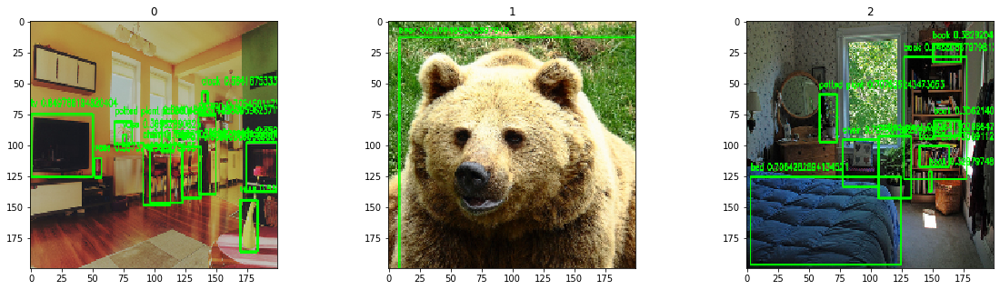



  0%|                                                                                 | 3/5000 [00:01<33:20,  2.50it/s]

  0%|                                                                                 | 4/5000 [00:01<25:51,  3.22it/s]

  0%|                                                                                 | 5/5000 [00:01<32:59,  2.52it/s]

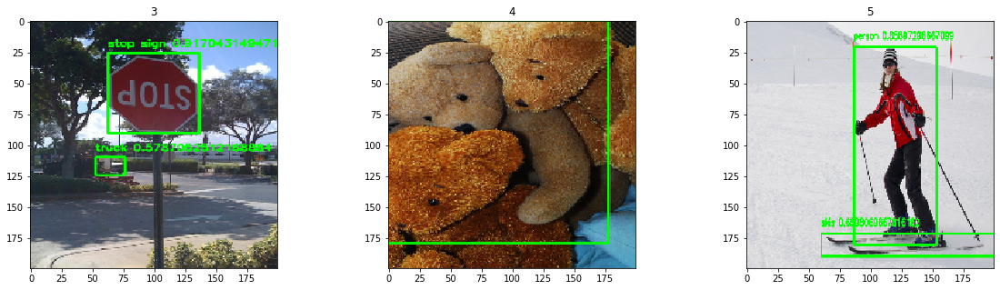



  0%|                                                                                 | 6/5000 [00:02<34:16,  2.43it/s]

  0%|                                                                                 | 7/5000 [00:02<27:04,  3.07it/s]

  0%|▏                                                                                | 8/5000 [00:02<21:48,  3.82it/s]

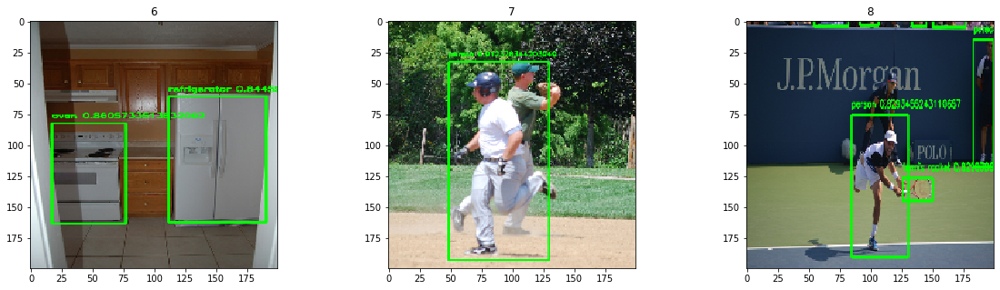



  0%|▏                                                                                | 9/5000 [00:03<31:11,  2.67it/s]

  0%|▏                                                                               | 10/5000 [00:04<46:31,  1.79it/s]

  0%|▏                                                                               | 11/5000 [00:04<37:49,  2.20it/s]

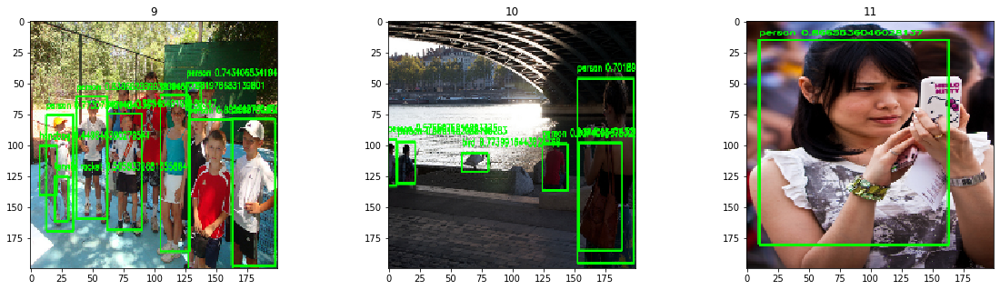



  0%|▏                                                                               | 12/5000 [00:05<46:00,  1.81it/s]

  0%|▏                                                                               | 13/5000 [00:05<40:09,  2.07it/s]

  0%|▏                                                                               | 14/5000 [00:05<32:50,  2.53it/s]

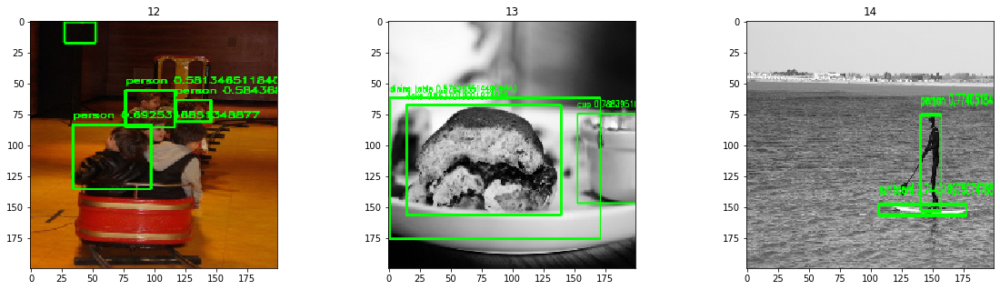



  0%|▏                                                                               | 15/5000 [00:06<34:23,  2.42it/s]

  0%|▎                                                                               | 16/5000 [00:06<28:56,  2.87it/s]

  0%|▎                                                                               | 17/5000 [00:06<24:45,  3.35it/s]

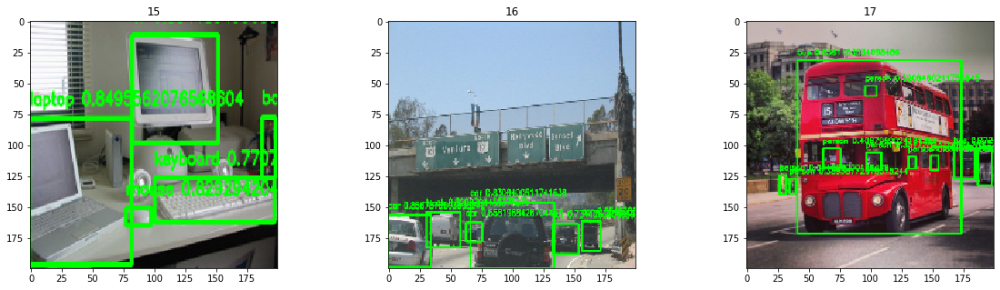



  0%|▎                                                                               | 18/5000 [00:07<31:56,  2.60it/s]

  0%|▎                                                                               | 19/5000 [00:07<29:39,  2.80it/s]

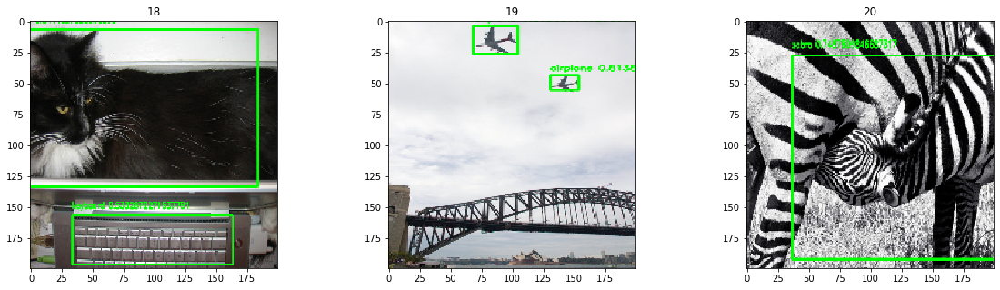



  0%|▎                                                                               | 21/5000 [00:08<34:48,  2.38it/s]

  0%|▎                                                                               | 22/5000 [00:08<30:14,  2.74it/s]

  0%|▎                                                                               | 23/5000 [00:08<24:32,  3.38it/s]

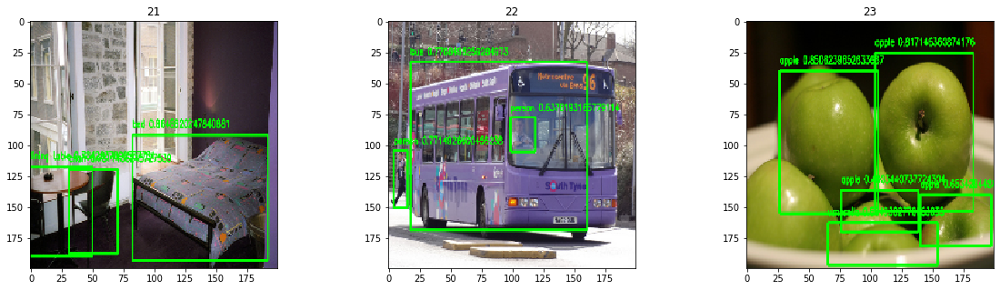



  0%|▍                                                                               | 24/5000 [00:09<32:05,  2.58it/s]

  0%|▍                                                                               | 25/5000 [00:09<27:13,  3.05it/s]

  1%|▍                                                                               | 26/5000 [00:10<28:18,  2.93it/s]

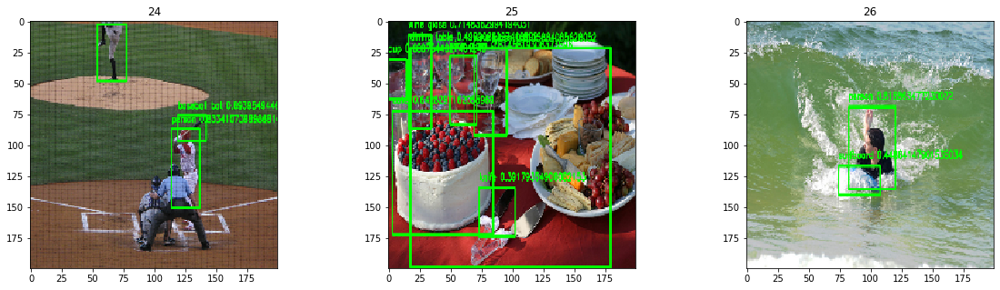



  1%|▍                                                                               | 27/5000 [00:10<31:36,  2.62it/s]

  1%|▍                                                                             | 28/5000 [00:18<3:40:00,  2.66s/it]

  1%|▍                                                                             | 29/5000 [00:18<2:41:38,  1.95s/it]

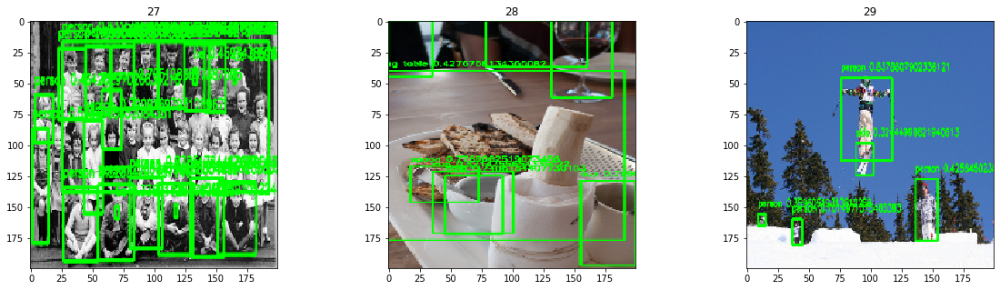



  1%|▍                                                                             | 30/5000 [00:19<2:04:54,  1.51s/it]

  1%|▍                                                                             | 31/5000 [00:19<1:29:58,  1.09s/it]

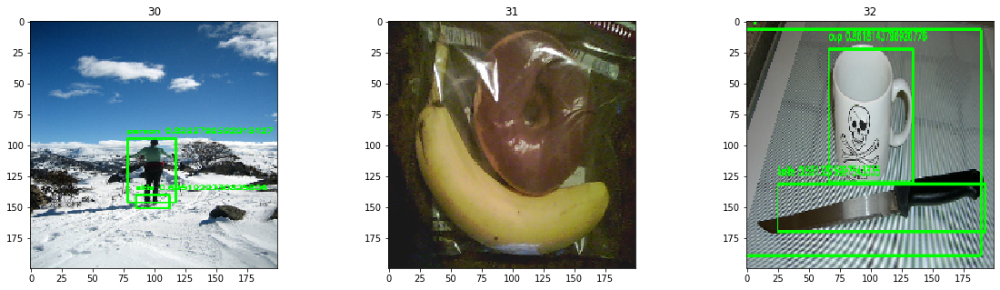



  1%|▌                                                                             | 33/5000 [00:20<1:12:08,  1.15it/s]

  1%|▌                                                                               | 34/5000 [00:20<57:58,  1.43it/s]

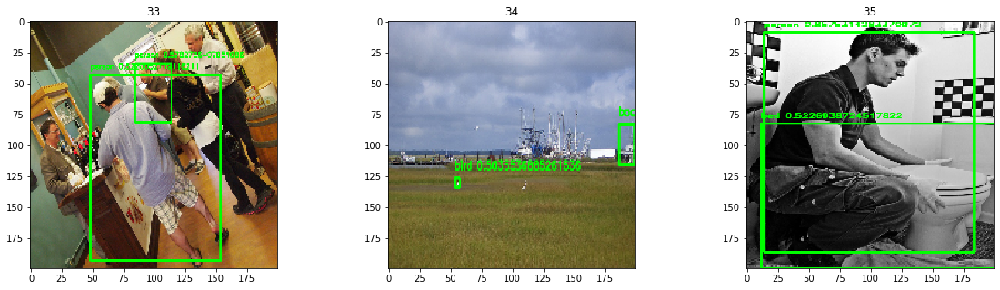



  1%|▌                                                                               | 36/5000 [00:21<48:50,  1.69it/s]

  1%|▌                                                                               | 38/5000 [00:21<37:30,  2.21it/s]

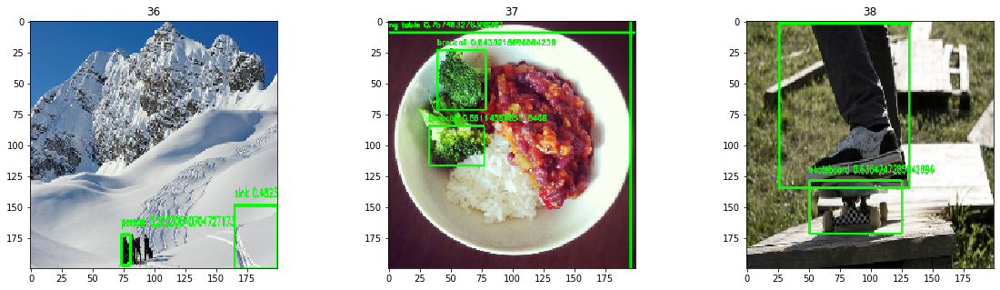



  1%|▌                                                                               | 39/5000 [00:21<41:12,  2.01it/s]

  1%|▋                                                                               | 41/5000 [00:22<32:32,  2.54it/s]

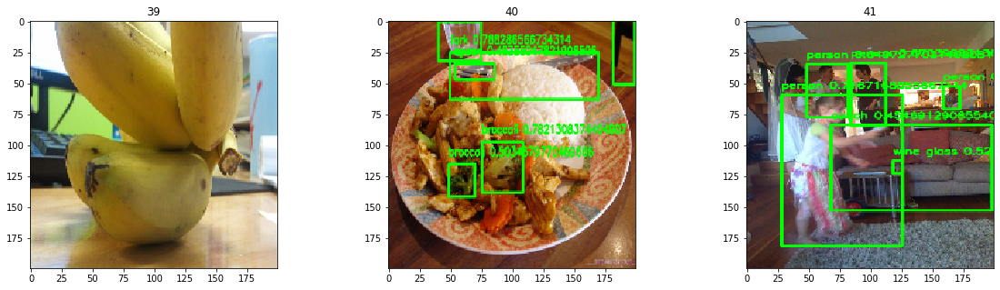



  1%|▋                                                                               | 42/5000 [00:22<38:29,  2.15it/s]

  1%|▋                                                                               | 43/5000 [00:24<57:11,  1.44it/s]

  1%|▋                                                                               | 44/5000 [00:24<47:23,  1.74it/s]

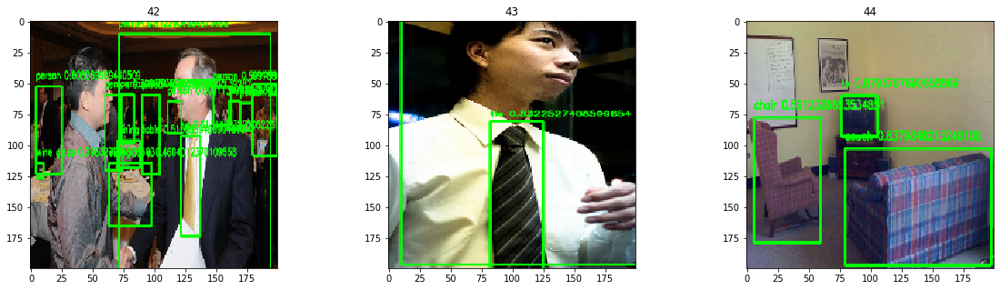



  1%|▋                                                                               | 45/5000 [00:24<45:00,  1.84it/s]

  1%|▋                                                                               | 46/5000 [00:25<34:51,  2.37it/s]

  1%|▊                                                                               | 47/5000 [00:25<34:31,  2.39it/s]

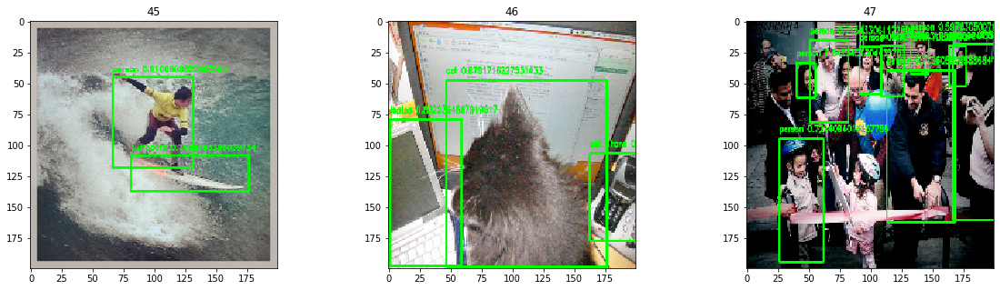



  1%|▊                                                                               | 48/5000 [00:26<53:25,  1.54it/s]

  1%|▊                                                                               | 49/5000 [00:26<40:16,  2.05it/s]

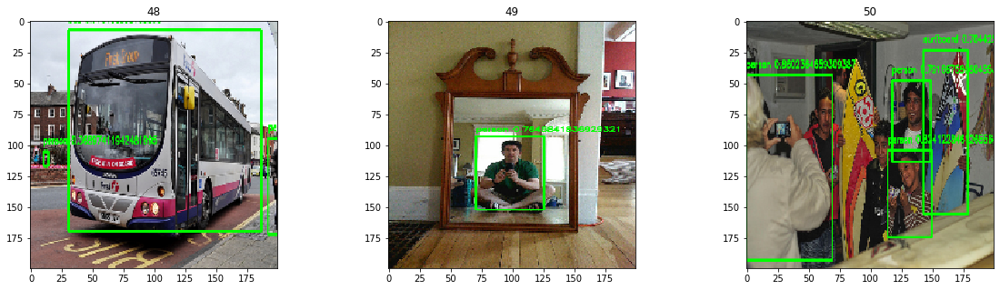



  1%|▊                                                                               | 51/5000 [00:27<36:10,  2.28it/s]

  1%|▊                                                                               | 52/5000 [00:27<29:59,  2.75it/s]

  1%|▊                                                                               | 53/5000 [00:27<24:48,  3.32it/s]

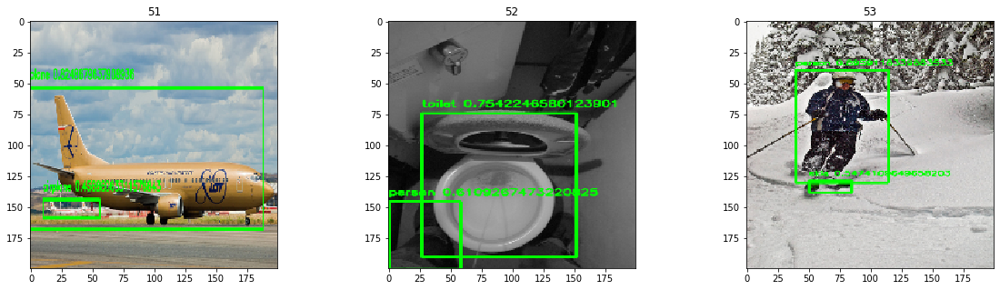



  1%|▊                                                                               | 54/5000 [00:28<28:02,  2.94it/s]

  1%|▉                                                                               | 55/5000 [00:28<23:09,  3.56it/s]

  1%|▉                                                                               | 56/5000 [00:28<19:55,  4.14it/s]

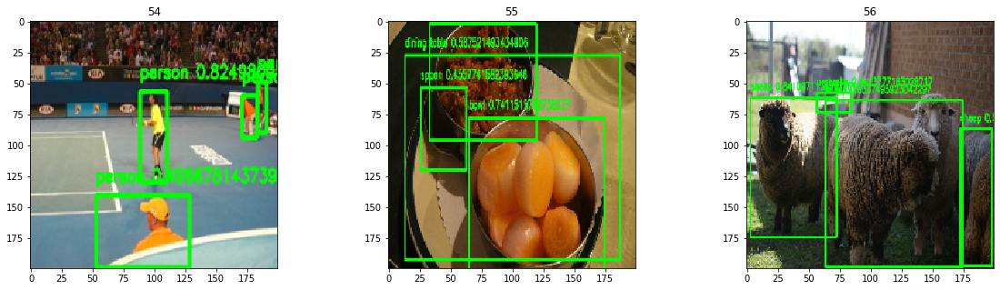



  1%|▉                                                                               | 57/5000 [00:29<28:17,  2.91it/s]

  1%|▉                                                                               | 59/5000 [00:29<23:05,  3.57it/s]

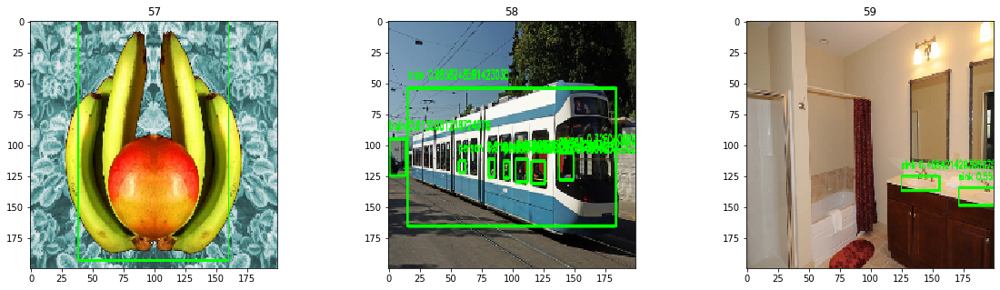



  1%|▉                                                                               | 60/5000 [00:29<26:41,  3.08it/s]

  1%|▉                                                                               | 62/5000 [00:30<26:02,  3.16it/s]

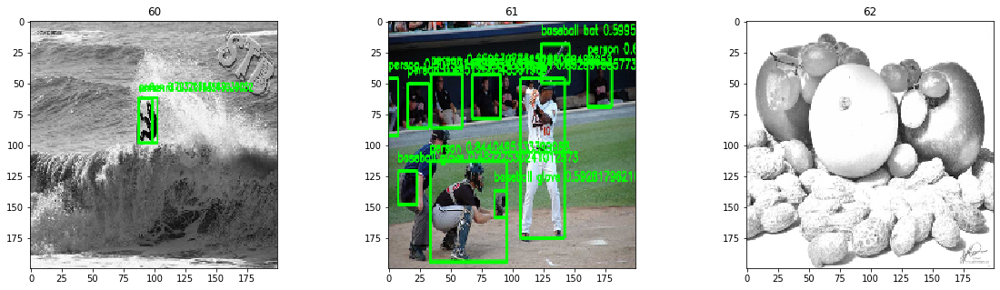



  1%|█                                                                               | 63/5000 [00:30<28:08,  2.92it/s]

  1%|█                                                                               | 64/5000 [00:30<22:21,  3.68it/s]

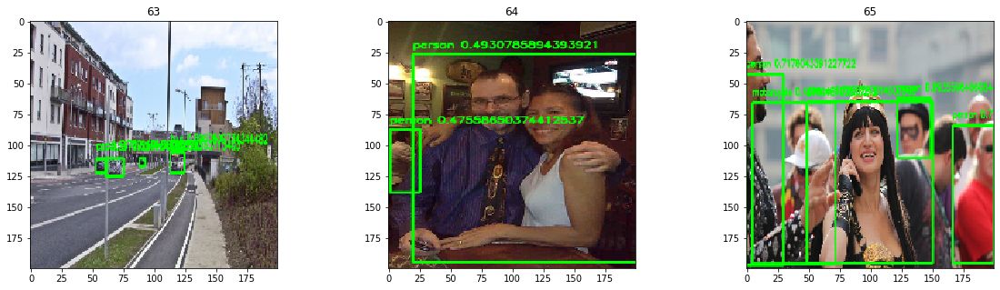



  1%|█                                                                               | 66/5000 [00:31<25:17,  3.25it/s]

  1%|█                                                                               | 67/5000 [00:31<20:26,  4.02it/s]

  1%|█                                                                               | 68/5000 [00:32<23:57,  3.43it/s]

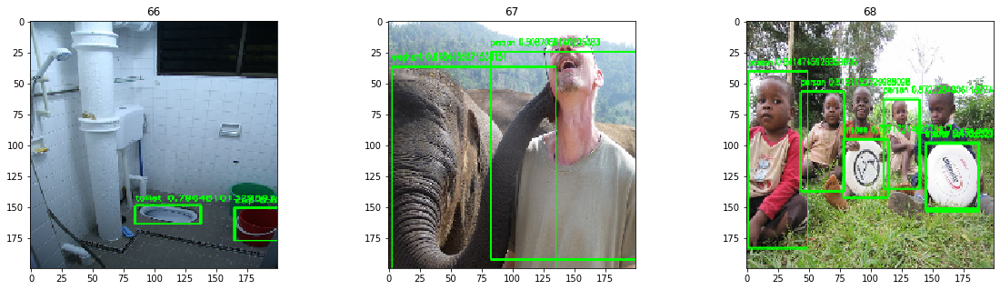



  1%|█                                                                               | 69/5000 [00:32<37:53,  2.17it/s]

  1%|█                                                                               | 70/5000 [00:33<30:13,  2.72it/s]

  1%|█▏                                                                              | 71/5000 [00:33<26:38,  3.08it/s]

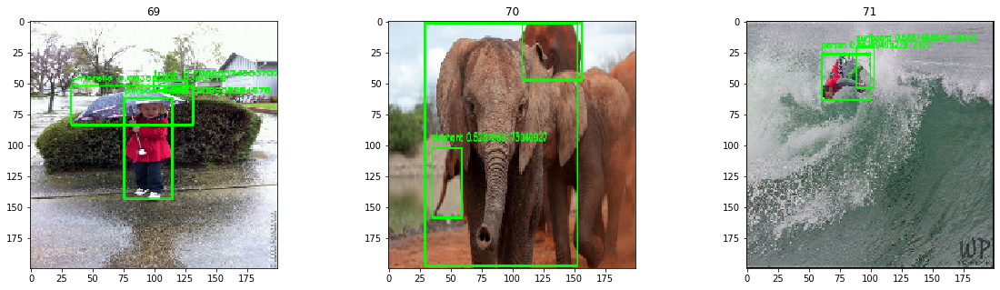



  1%|█▏                                                                              | 72/5000 [00:33<29:11,  2.81it/s]

  1%|█▏                                                                              | 73/5000 [00:33<25:20,  3.24it/s]

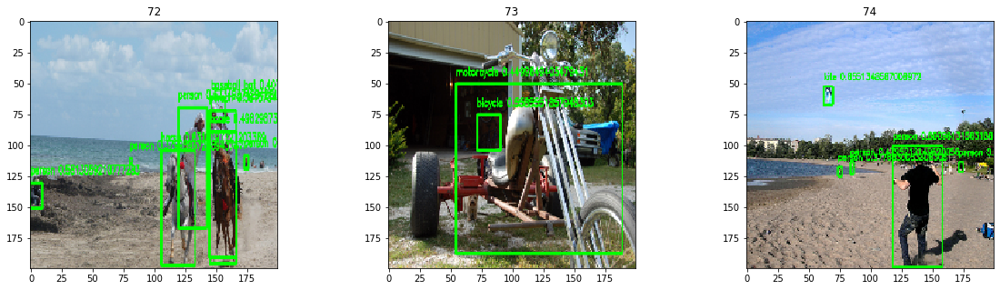



  2%|█▏                                                                              | 75/5000 [00:34<24:38,  3.33it/s]

  2%|█▏                                                                              | 76/5000 [00:34<23:40,  3.47it/s]

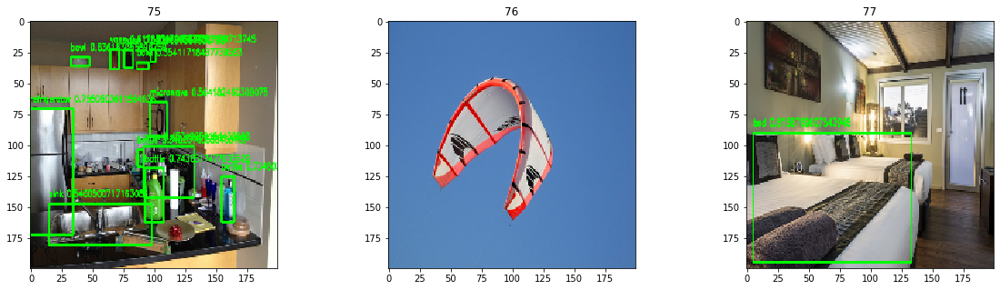



  2%|█▏                                                                              | 78/5000 [00:35<23:30,  3.49it/s]

  2%|█▎                                                                              | 79/5000 [00:35<27:38,  2.97it/s]

  2%|█▎                                                                              | 80/5000 [00:36<24:06,  3.40it/s]

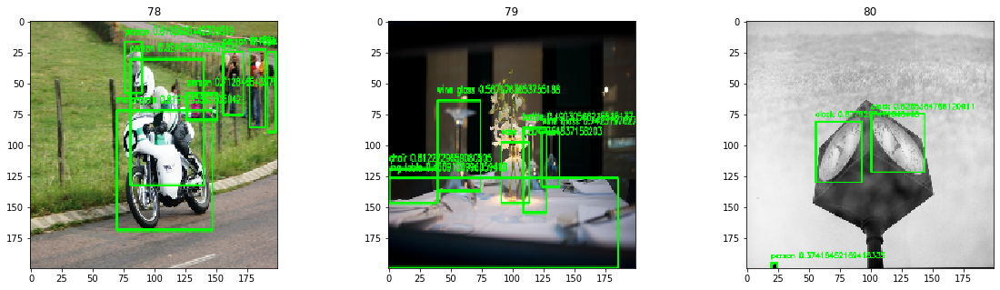



  2%|█▎                                                                              | 81/5000 [00:36<27:55,  2.94it/s]

  2%|█▎                                                                              | 82/5000 [00:36<22:08,  3.70it/s]

  2%|█▎                                                                              | 83/5000 [00:36<18:18,  4.48it/s]

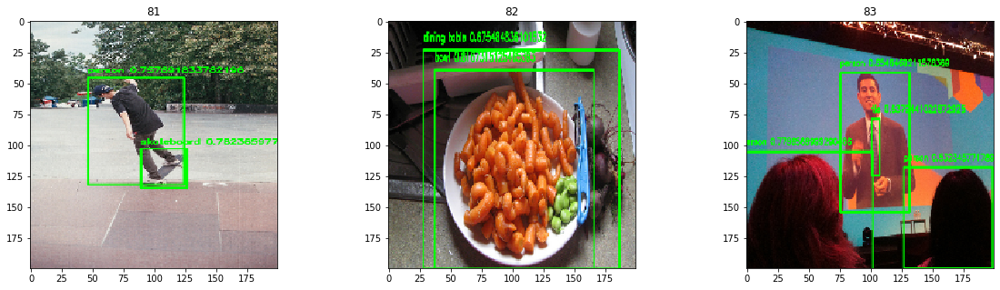



  2%|█▎                                                                              | 84/5000 [00:37<25:43,  3.18it/s]

  2%|█▎                                                                              | 85/5000 [00:37<23:16,  3.52it/s]

  2%|█▍                                                                              | 86/5000 [00:37<19:25,  4.21it/s]

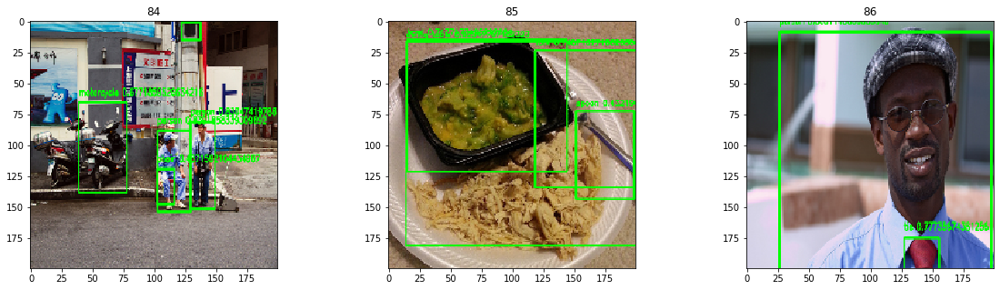



  2%|█▍                                                                              | 87/5000 [00:38<27:05,  3.02it/s]

  2%|█▍                                                                              | 88/5000 [00:38<22:21,  3.66it/s]

  2%|█▍                                                                              | 89/5000 [00:38<19:26,  4.21it/s]

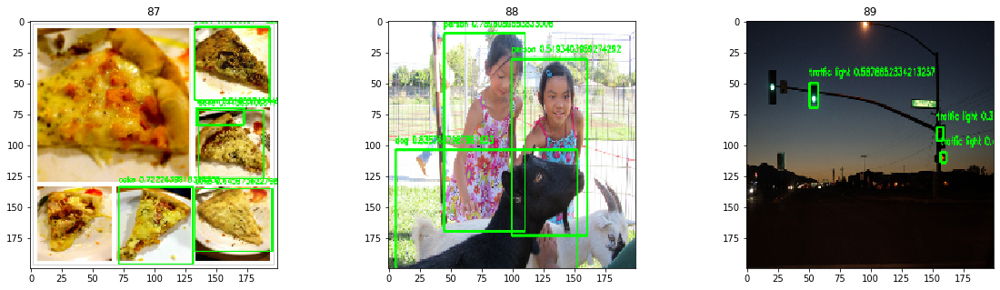



  2%|█▍                                                                              | 90/5000 [00:38<24:34,  3.33it/s]

  2%|█▍                                                                              | 91/5000 [00:39<21:24,  3.82it/s]

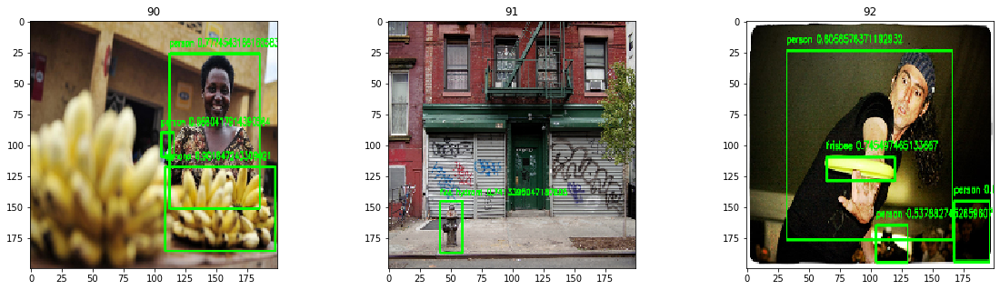



  2%|█▍                                                                              | 93/5000 [00:39<21:25,  3.82it/s]

  2%|█▌                                                                              | 94/5000 [00:40<46:53,  1.74it/s]

  2%|█▌                                                                              | 95/5000 [00:41<39:18,  2.08it/s]

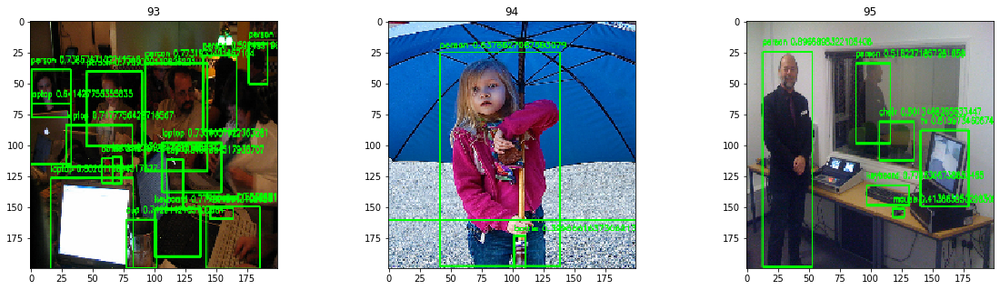



  2%|█▌                                                                              | 96/5000 [00:41<41:06,  1.99it/s]

  2%|█▌                                                                              | 97/5000 [00:42<38:56,  2.10it/s]

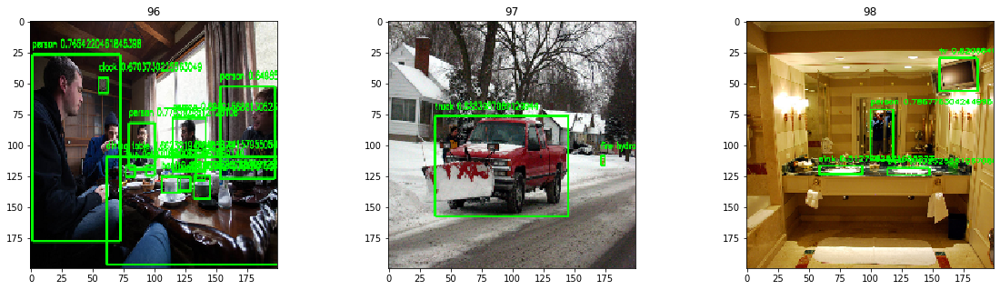



  2%|█▌                                                                              | 99/5000 [00:42<33:54,  2.41it/s]

  2%|█▌                                                                             | 100/5000 [00:42<32:02,  2.55it/s]

  2%|█▌                                                                             | 102/5000 [00:43<25:00,  3.26it/s]

  2%|█▋                                                                             | 103/5000 [00:43<20:27,  3.99it/s]

  2%|█▋                                                                             | 104/5000 [00:43<17:20,  4.71it/s]

  2%|█▋                                                                             | 105/5000 [00:43<23:21,  3.49it/s]

  2%|█▋                                                                             | 106/5000 [00:44<19:24,  4.20it/s]

  2%|█▋                                                                             | 108/5000 [00:44<15:35,  5.23it/s]

  2%|█▋                       

  4%|██▉                                                                            | 183/5000 [01:02<53:30,  1.50it/s]

  4%|██▉                                                                            | 185/5000 [01:02<40:38,  1.97it/s]

  4%|██▉                                                                            | 186/5000 [01:02<31:15,  2.57it/s]

  4%|██▉                                                                            | 188/5000 [01:02<23:55,  3.35it/s]

  4%|██▉                                                                            | 189/5000 [01:02<21:08,  3.79it/s]

  4%|███                                                                            | 191/5000 [01:04<27:46,  2.89it/s]

  4%|███                                                                            | 192/5000 [01:04<22:04,  3.63it/s]

  4%|███                                                                            | 193/5000 [01:04<18:36,  4.31it/s]

  4%|███                        

  5%|████                                                                           | 261/5000 [01:19<18:05,  4.37it/s]

  5%|████▏                                                                          | 262/5000 [01:19<16:57,  4.66it/s]

  5%|████▏                                                                          | 264/5000 [01:19<14:04,  5.60it/s]

  5%|████▏                                                                          | 265/5000 [01:19<13:16,  5.95it/s]

  5%|████▏                                                                          | 267/5000 [01:20<14:25,  5.47it/s]

  5%|████▏                                                                          | 268/5000 [01:20<16:09,  4.88it/s]

  5%|████▎                                                                          | 270/5000 [01:20<13:19,  5.91it/s]

  5%|████▎                                                                          | 271/5000 [01:20<12:11,  6.47it/s]

  5%|████▎                      

  7%|█████▍                                                                         | 343/5000 [01:35<14:08,  5.49it/s]

  7%|█████▍                                                                         | 345/5000 [01:36<12:59,  5.97it/s]

  7%|█████▍                                                                         | 346/5000 [01:36<11:47,  6.57it/s]

  7%|█████▍                                                                         | 348/5000 [01:36<10:48,  7.17it/s]

  7%|█████▌                                                                         | 350/5000 [01:36<09:43,  7.97it/s]

  7%|█████▌                                                                         | 351/5000 [01:36<10:05,  7.68it/s]

  7%|█████▌                                                                         | 352/5000 [01:37<11:30,  6.73it/s]

  7%|█████▌                                                                         | 353/5000 [01:37<12:28,  6.21it/s]

  7%|█████▌                     

  9%|██████▋                                                                        | 426/5000 [01:49<11:49,  6.45it/s]

  9%|██████▊                                                                        | 428/5000 [01:49<13:00,  5.86it/s]

  9%|██████▊                                                                        | 430/5000 [01:50<11:46,  6.47it/s]

  9%|██████▊                                                                        | 431/5000 [01:50<15:31,  4.90it/s]

  9%|██████▊                                                                        | 432/5000 [01:50<15:34,  4.89it/s]

  9%|██████▊                                                                        | 433/5000 [01:50<14:16,  5.33it/s]

  9%|██████▊                                                                        | 435/5000 [01:51<12:57,  5.87it/s]

  9%|██████▉                                                                        | 436/5000 [01:51<11:29,  6.62it/s]

  9%|██████▉                    

 10%|████████                                                                       | 514/5000 [02:06<20:23,  3.67it/s]

 10%|████████▏                                                                      | 515/5000 [02:07<32:13,  2.32it/s]

 10%|████████▏                                                                      | 516/5000 [02:07<28:00,  2.67it/s]

 10%|████████▏                                                                      | 517/5000 [02:08<24:20,  3.07it/s]

 10%|████████▏                                                                      | 518/5000 [02:09<46:59,  1.59it/s]

 10%|████████▏                                                                      | 519/5000 [02:09<35:13,  2.12it/s]

 10%|████████▏                                                                      | 520/5000 [02:09<27:05,  2.76it/s]

 10%|████████▏                                                                      | 522/5000 [02:09<23:00,  3.24it/s]

 10%|████████▎                  

 12%|█████████▎                                                                     | 587/5000 [02:27<19:25,  3.79it/s]

 12%|█████████▎                                                                     | 589/5000 [02:27<15:47,  4.66it/s]

 12%|█████████▎                                                                     | 590/5000 [02:27<15:58,  4.60it/s]

 12%|█████████▎                                                                     | 592/5000 [02:28<13:29,  5.45it/s]

 12%|█████████▎                                                                     | 593/5000 [02:28<18:44,  3.92it/s]

 12%|█████████▍                                                                     | 594/5000 [02:28<15:27,  4.75it/s]

 12%|█████████▍                                                                     | 595/5000 [02:28<14:13,  5.16it/s]

 12%|█████████▍                                                                     | 596/5000 [02:29<32:30,  2.26it/s]

 12%|█████████▍                 

 13%|██████████▍                                                                    | 662/5000 [02:45<20:00,  3.61it/s]

 13%|██████████▍                                                                    | 663/5000 [02:45<16:51,  4.29it/s]

 13%|██████████▌                                                                    | 665/5000 [02:45<14:46,  4.89it/s]

 13%|██████████▌                                                                    | 666/5000 [02:45<12:32,  5.76it/s]

 13%|██████████▌                                                                    | 668/5000 [02:46<13:12,  5.47it/s]

 13%|██████████▌                                                                    | 670/5000 [02:46<11:15,  6.41it/s]

 13%|██████████▌                                                                    | 672/5000 [02:46<09:50,  7.33it/s]

 13%|██████████▋                                                                    | 673/5000 [02:46<13:03,  5.52it/s]

 14%|██████████▋                

 15%|███████████▊                                                                   | 745/5000 [02:59<15:06,  4.69it/s]

 15%|███████████▊                                                                   | 747/5000 [02:59<13:27,  5.27it/s]

 15%|███████████▊                                                                   | 749/5000 [03:00<11:10,  6.34it/s]

 15%|███████████▊                                                                   | 750/5000 [03:00<10:14,  6.92it/s]

 15%|███████████▊                                                                   | 751/5000 [03:00<10:20,  6.85it/s]

 15%|███████████▉                                                                   | 752/5000 [03:00<11:07,  6.36it/s]

 15%|███████████▉                                                                   | 753/5000 [03:00<11:10,  6.33it/s]

 15%|███████████▉                                                                   | 754/5000 [03:00<12:56,  5.47it/s]

 15%|███████████▉               

 17%|█████████████                                                                  | 830/5000 [03:14<15:20,  4.53it/s]

 17%|█████████████▏                                                                 | 831/5000 [03:14<13:43,  5.06it/s]

 17%|█████████████▏                                                                 | 833/5000 [03:14<11:13,  6.19it/s]

 17%|█████████████▏                                                                 | 834/5000 [03:14<10:14,  6.78it/s]

 17%|█████████████▏                                                                 | 835/5000 [03:14<09:56,  6.98it/s]

 17%|█████████████▏                                                                 | 837/5000 [03:15<13:11,  5.26it/s]

 17%|█████████████▎                                                                 | 839/5000 [03:15<13:04,  5.31it/s]

 17%|█████████████▎                                                                 | 840/5000 [03:15<12:23,  5.59it/s]

 17%|█████████████▎             

 18%|██████████████▌                                                                | 924/5000 [03:27<09:16,  7.32it/s]

 18%|██████████████▌                                                                | 925/5000 [03:28<12:30,  5.43it/s]

 19%|██████████████▋                                                                | 927/5000 [03:28<10:11,  6.66it/s]

 19%|██████████████▋                                                                | 928/5000 [03:28<09:48,  6.92it/s]

 19%|██████████████▋                                                                | 929/5000 [03:28<11:01,  6.16it/s]

 19%|██████████████▋                                                                | 930/5000 [03:28<11:05,  6.12it/s]

 19%|██████████████▋                                                                | 932/5000 [03:28<09:49,  6.90it/s]

 19%|██████████████▊                                                                | 934/5000 [03:29<08:39,  7.83it/s]

 19%|██████████████▊            

 20%|███████████████▊                                                              | 1010/5000 [03:43<12:39,  5.25it/s]

 20%|███████████████▊                                                              | 1011/5000 [03:44<13:22,  4.97it/s]

 20%|███████████████▊                                                              | 1013/5000 [03:44<11:03,  6.01it/s]

 20%|███████████████▊                                                              | 1015/5000 [03:45<18:54,  3.51it/s]

 20%|███████████████▊                                                              | 1017/5000 [03:45<15:53,  4.18it/s]

 20%|███████████████▉                                                              | 1018/5000 [03:45<13:27,  4.93it/s]

 20%|███████████████▉                                                              | 1019/5000 [03:45<11:37,  5.71it/s]

 20%|███████████████▉                                                              | 1020/5000 [03:46<10:09,  6.53it/s]

 20%|███████████████▉           

 22%|█████████████████                                                             | 1093/5000 [04:01<09:29,  6.86it/s]

 22%|█████████████████                                                             | 1095/5000 [04:01<08:29,  7.66it/s]

 22%|█████████████████                                                             | 1096/5000 [04:01<07:53,  8.24it/s]

 22%|█████████████████▏                                                            | 1098/5000 [04:01<07:45,  8.39it/s]

 22%|█████████████████▏                                                            | 1099/5000 [04:01<11:47,  5.52it/s]

 22%|█████████████████▏                                                            | 1100/5000 [04:02<13:11,  4.93it/s]

 22%|█████████████████▏                                                            | 1101/5000 [04:02<15:39,  4.15it/s]

 22%|█████████████████▏                                                            | 1103/5000 [04:02<12:27,  5.21it/s]

 22%|█████████████████▏         

 24%|██████████████████▎                                                           | 1176/5000 [04:17<15:00,  4.25it/s]

 24%|██████████████████▎                                                           | 1177/5000 [04:17<13:32,  4.71it/s]

 24%|██████████████████▍                                                           | 1179/5000 [04:17<11:57,  5.32it/s]

 24%|██████████████████▍                                                           | 1180/5000 [04:18<11:15,  5.65it/s]

 24%|██████████████████▍                                                           | 1182/5000 [04:18<09:39,  6.59it/s]

 24%|██████████████████▍                                                           | 1184/5000 [04:18<08:21,  7.61it/s]

 24%|██████████████████▍                                                           | 1185/5000 [04:18<13:01,  4.88it/s]

 24%|██████████████████▌                                                           | 1186/5000 [04:19<12:57,  4.91it/s]

 24%|██████████████████▌        

 25%|███████████████████▋                                                          | 1260/5000 [04:33<15:11,  4.10it/s]

 25%|███████████████████▋                                                          | 1261/5000 [04:33<14:18,  4.36it/s]

 25%|███████████████████▋                                                          | 1262/5000 [04:34<17:40,  3.53it/s]

 25%|███████████████████▋                                                          | 1263/5000 [04:34<19:32,  3.19it/s]

 25%|███████████████████▋                                                          | 1264/5000 [04:34<18:10,  3.42it/s]

 25%|███████████████████▋                                                          | 1265/5000 [04:35<15:25,  4.04it/s]

 25%|███████████████████▊                                                          | 1267/5000 [04:35<13:03,  4.77it/s]

 25%|███████████████████▊                                                          | 1268/5000 [04:35<11:15,  5.52it/s]

 25%|███████████████████▊       

 27%|████████████████████▉                                                         | 1344/5000 [04:50<09:30,  6.41it/s]

 27%|████████████████████▉                                                         | 1345/5000 [04:50<08:50,  6.89it/s]

 27%|█████████████████████                                                         | 1347/5000 [04:51<08:48,  6.91it/s]

 27%|█████████████████████                                                         | 1348/5000 [04:51<08:20,  7.30it/s]

 27%|█████████████████████                                                         | 1350/5000 [04:51<07:43,  7.87it/s]

 27%|█████████████████████                                                         | 1352/5000 [04:51<07:38,  7.95it/s]

 27%|█████████████████████                                                         | 1353/5000 [04:51<07:21,  8.27it/s]

 27%|█████████████████████                                                         | 1354/5000 [04:52<08:38,  7.04it/s]

 27%|█████████████████████▏     

 29%|██████████████████████▎                                                       | 1429/5000 [05:08<14:19,  4.15it/s]

 29%|██████████████████████▎                                                       | 1430/5000 [05:09<14:39,  4.06it/s]

 29%|██████████████████████▎                                                       | 1431/5000 [05:09<12:29,  4.76it/s]

 29%|██████████████████████▎                                                       | 1432/5000 [05:09<20:08,  2.95it/s]

 29%|██████████████████████▎                                                       | 1433/5000 [05:10<22:07,  2.69it/s]

 29%|██████████████████████▍                                                       | 1435/5000 [05:10<16:52,  3.52it/s]

 29%|██████████████████████▍                                                       | 1436/5000 [05:10<15:09,  3.92it/s]

 29%|██████████████████████▍                                                       | 1438/5000 [05:10<11:53,  4.99it/s]

 29%|██████████████████████▍    

 30%|███████████████████████▌                                                      | 1512/5000 [05:26<08:25,  6.90it/s]

 30%|███████████████████████▌                                                      | 1513/5000 [05:26<11:08,  5.22it/s]

 30%|███████████████████████▌                                                      | 1514/5000 [05:26<09:45,  5.95it/s]

 30%|███████████████████████▋                                                      | 1516/5000 [05:26<08:32,  6.80it/s]

 30%|███████████████████████▋                                                      | 1517/5000 [05:27<13:18,  4.36it/s]

 30%|███████████████████████▋                                                      | 1518/5000 [05:27<12:17,  4.72it/s]

 30%|███████████████████████▋                                                      | 1519/5000 [05:27<12:32,  4.63it/s]

 30%|███████████████████████▋                                                      | 1520/5000 [05:27<14:34,  3.98it/s]

 30%|███████████████████████▋   

 32%|████████████████████████▊                                                     | 1589/5000 [05:44<18:12,  3.12it/s]

 32%|████████████████████████▊                                                     | 1591/5000 [05:45<14:05,  4.03it/s]

 32%|████████████████████████▊                                                     | 1592/5000 [05:45<16:36,  3.42it/s]

 32%|████████████████████████▊                                                     | 1593/5000 [05:45<14:03,  4.04it/s]

 32%|████████████████████████▊                                                     | 1594/5000 [05:45<11:41,  4.86it/s]

 32%|████████████████████████▉                                                     | 1595/5000 [05:45<10:52,  5.22it/s]

 32%|████████████████████████▉                                                     | 1596/5000 [05:46<13:18,  4.26it/s]

 32%|████████████████████████▉                                                     | 1597/5000 [05:46<12:15,  4.63it/s]

 32%|████████████████████████▉  

 34%|██████████████████████████▏                                                   | 1678/5000 [06:01<09:54,  5.59it/s]

 34%|██████████████████████████▏                                                   | 1680/5000 [06:01<08:30,  6.50it/s]

 34%|██████████████████████████▏                                                   | 1681/5000 [06:01<11:48,  4.68it/s]

 34%|██████████████████████████▎                                                   | 1683/5000 [06:02<10:38,  5.19it/s]

 34%|██████████████████████████▎                                                   | 1684/5000 [06:02<14:57,  3.69it/s]

 34%|██████████████████████████▎                                                   | 1685/5000 [06:02<14:14,  3.88it/s]

 34%|██████████████████████████▎                                                   | 1686/5000 [06:03<15:00,  3.68it/s]

 34%|██████████████████████████▎                                                   | 1687/5000 [06:03<12:14,  4.51it/s]

 34%|██████████████████████████▎

 35%|███████████████████████████▌                                                  | 1763/5000 [06:17<11:28,  4.70it/s]

 35%|███████████████████████████▌                                                  | 1764/5000 [06:17<09:51,  5.47it/s]

 35%|███████████████████████████▌                                                  | 1765/5000 [06:17<09:08,  5.90it/s]

 35%|███████████████████████████▌                                                  | 1766/5000 [06:17<09:04,  5.94it/s]

 35%|███████████████████████████▌                                                  | 1767/5000 [06:18<23:16,  2.31it/s]

 35%|███████████████████████████▌                                                  | 1769/5000 [06:19<18:23,  2.93it/s]

 35%|███████████████████████████▌                                                  | 1770/5000 [06:19<14:42,  3.66it/s]

 35%|███████████████████████████▋                                                  | 1771/5000 [06:19<14:18,  3.76it/s]

 35%|███████████████████████████

 37%|████████████████████████████▋                                                 | 1842/5000 [06:35<13:42,  3.84it/s]

 37%|████████████████████████████▊                                                 | 1843/5000 [06:35<12:04,  4.35it/s]

 37%|████████████████████████████▊                                                 | 1844/5000 [06:35<11:40,  4.51it/s]

 37%|████████████████████████████▊                                                 | 1845/5000 [06:36<11:21,  4.63it/s]

 37%|████████████████████████████▊                                                 | 1846/5000 [06:36<12:41,  4.14it/s]

 37%|████████████████████████████▊                                                 | 1847/5000 [06:36<10:35,  4.96it/s]

 37%|████████████████████████████▊                                                 | 1848/5000 [06:36<09:11,  5.72it/s]

 37%|████████████████████████████▊                                                 | 1849/5000 [06:36<09:16,  5.66it/s]

 37%|███████████████████████████

 39%|██████████████████████████████                                                | 1926/5000 [06:49<08:17,  6.18it/s]

 39%|██████████████████████████████                                                | 1928/5000 [06:49<07:10,  7.14it/s]

 39%|██████████████████████████████                                                | 1930/5000 [06:49<06:23,  8.00it/s]

 39%|██████████████████████████████                                                | 1931/5000 [06:49<06:14,  8.20it/s]

 39%|██████████████████████████████▏                                               | 1932/5000 [06:49<06:15,  8.17it/s]

 39%|██████████████████████████████▏                                               | 1934/5000 [06:50<05:53,  8.68it/s]

 39%|██████████████████████████████▏                                               | 1935/5000 [06:50<06:09,  8.30it/s]

 39%|██████████████████████████████▏                                               | 1936/5000 [06:50<10:06,  5.05it/s]

 39%|███████████████████████████

 40%|███████████████████████████████▎                                              | 2008/5000 [07:05<09:48,  5.08it/s]

 40%|███████████████████████████████▎                                              | 2009/5000 [07:05<08:51,  5.63it/s]

 40%|███████████████████████████████▎                                              | 2010/5000 [07:06<13:48,  3.61it/s]

 40%|███████████████████████████████▎                                              | 2011/5000 [07:06<11:32,  4.32it/s]

 40%|███████████████████████████████▍                                              | 2012/5000 [07:06<10:13,  4.87it/s]

 40%|███████████████████████████████▍                                              | 2014/5000 [07:06<08:28,  5.88it/s]

 40%|███████████████████████████████▍                                              | 2016/5000 [07:06<08:28,  5.87it/s]

 40%|███████████████████████████████▍                                              | 2018/5000 [07:07<07:21,  6.76it/s]

 40%|███████████████████████████

 42%|████████████████████████████████▌                                             | 2089/5000 [07:24<10:55,  4.44it/s]

 42%|████████████████████████████████▌                                             | 2090/5000 [07:24<17:37,  2.75it/s]

 42%|████████████████████████████████▋                                             | 2092/5000 [07:25<13:43,  3.53it/s]

 42%|████████████████████████████████▋                                             | 2094/5000 [07:25<11:32,  4.20it/s]

 42%|████████████████████████████████▋                                             | 2096/5000 [07:26<16:31,  2.93it/s]

 42%|████████████████████████████████▋                                             | 2098/5000 [07:26<13:02,  3.71it/s]

 42%|████████████████████████████████▋                                             | 2099/5000 [07:26<10:52,  4.45it/s]

 42%|████████████████████████████████▊                                             | 2100/5000 [07:26<09:21,  5.16it/s]

 42%|███████████████████████████

 44%|█████████████████████████████████▉                                            | 2178/5000 [07:48<08:53,  5.29it/s]

 44%|█████████████████████████████████▉                                            | 2179/5000 [07:48<09:34,  4.91it/s]

 44%|██████████████████████████████████                                            | 2180/5000 [07:48<08:30,  5.52it/s]

 44%|██████████████████████████████████                                            | 2181/5000 [07:49<13:12,  3.56it/s]

 44%|██████████████████████████████████                                            | 2182/5000 [07:49<11:44,  4.00it/s]

 44%|██████████████████████████████████                                            | 2183/5000 [07:50<30:03,  1.56it/s]

 44%|██████████████████████████████████                                            | 2184/5000 [07:51<22:26,  2.09it/s]

 44%|██████████████████████████████████                                            | 2185/5000 [07:51<18:01,  2.60it/s]

 44%|███████████████████████████

 45%|███████████████████████████████████▏                                          | 2257/5000 [08:04<07:27,  6.13it/s]

 45%|███████████████████████████████████▏                                          | 2258/5000 [08:04<09:16,  4.93it/s]

 45%|███████████████████████████████████▎                                          | 2260/5000 [08:04<07:34,  6.03it/s]

 45%|███████████████████████████████████▎                                          | 2262/5000 [08:04<06:49,  6.68it/s]

 45%|███████████████████████████████████▎                                          | 2264/5000 [08:04<06:02,  7.54it/s]

 45%|███████████████████████████████████▎                                          | 2265/5000 [08:05<06:27,  7.06it/s]

 45%|███████████████████████████████████▎                                          | 2267/5000 [08:05<05:55,  7.70it/s]

 45%|███████████████████████████████████▍                                          | 2269/5000 [08:05<05:41,  8.01it/s]

 45%|███████████████████████████

 47%|████████████████████████████████████▌                                         | 2343/5000 [08:21<10:15,  4.32it/s]

 47%|████████████████████████████████████▌                                         | 2344/5000 [08:21<08:33,  5.17it/s]

 47%|████████████████████████████████████▌                                         | 2345/5000 [08:21<08:22,  5.29it/s]

 47%|████████████████████████████████████▌                                         | 2347/5000 [08:22<08:37,  5.13it/s]

 47%|████████████████████████████████████▋                                         | 2348/5000 [08:22<10:57,  4.04it/s]

 47%|████████████████████████████████████▋                                         | 2349/5000 [08:22<09:22,  4.71it/s]

 47%|████████████████████████████████████▋                                         | 2351/5000 [08:23<10:45,  4.11it/s]

 47%|████████████████████████████████████▋                                         | 2352/5000 [08:23<09:44,  4.53it/s]

 47%|███████████████████████████

 48%|█████████████████████████████████████▊                                        | 2425/5000 [08:40<06:43,  6.38it/s]

 49%|█████████████████████████████████████▊                                        | 2426/5000 [08:40<10:09,  4.22it/s]

 49%|█████████████████████████████████████▊                                        | 2427/5000 [08:40<08:45,  4.90it/s]

 49%|█████████████████████████████████████▉                                        | 2429/5000 [08:40<07:30,  5.70it/s]

 49%|█████████████████████████████████████▉                                        | 2430/5000 [08:41<06:37,  6.46it/s]

 49%|█████████████████████████████████████▉                                        | 2432/5000 [08:41<06:51,  6.24it/s]

 49%|█████████████████████████████████████▉                                        | 2434/5000 [08:41<06:24,  6.68it/s]

 49%|██████████████████████████████████████                                        | 2436/5000 [08:41<05:34,  7.67it/s]

 49%|███████████████████████████

 50%|███████████████████████████████████████▏                                      | 2511/5000 [08:56<06:54,  6.00it/s]

 50%|███████████████████████████████████████▏                                      | 2512/5000 [08:57<06:29,  6.39it/s]

 50%|███████████████████████████████████████▏                                      | 2513/5000 [08:57<06:00,  6.90it/s]

 50%|███████████████████████████████████████▏                                      | 2514/5000 [08:57<05:29,  7.54it/s]

 50%|███████████████████████████████████████▏                                      | 2516/5000 [08:57<05:50,  7.09it/s]

 50%|███████████████████████████████████████▎                                      | 2518/5000 [08:57<05:27,  7.58it/s]

 50%|███████████████████████████████████████▎                                      | 2519/5000 [08:58<14:46,  2.80it/s]

 50%|███████████████████████████████████████▎                                      | 2520/5000 [08:58<11:50,  3.49it/s]

 50%|███████████████████████████

 52%|████████████████████████████████████████▍                                     | 2591/5000 [09:12<11:33,  3.47it/s]

 52%|████████████████████████████████████████▍                                     | 2592/5000 [09:12<10:46,  3.72it/s]

 52%|████████████████████████████████████████▍                                     | 2593/5000 [09:12<08:52,  4.52it/s]

 52%|████████████████████████████████████████▍                                     | 2594/5000 [09:13<11:25,  3.51it/s]

 52%|████████████████████████████████████████▍                                     | 2595/5000 [09:13<10:33,  3.80it/s]

 52%|████████████████████████████████████████▍                                     | 2596/5000 [09:14<13:45,  2.91it/s]

 52%|████████████████████████████████████████▌                                     | 2597/5000 [09:14<11:49,  3.39it/s]

 52%|████████████████████████████████████████▌                                     | 2598/5000 [09:14<10:00,  4.00it/s]

 52%|███████████████████████████

 54%|█████████████████████████████████████████▋                                    | 2676/5000 [09:28<05:33,  6.97it/s]

 54%|█████████████████████████████████████████▊                                    | 2678/5000 [09:28<05:28,  7.07it/s]

 54%|█████████████████████████████████████████▊                                    | 2680/5000 [09:28<04:47,  8.07it/s]

 54%|█████████████████████████████████████████▊                                    | 2681/5000 [09:28<06:01,  6.42it/s]

 54%|█████████████████████████████████████████▊                                    | 2683/5000 [09:29<05:17,  7.30it/s]

 54%|█████████████████████████████████████████▉                                    | 2685/5000 [09:29<04:44,  8.15it/s]

 54%|█████████████████████████████████████████▉                                    | 2686/5000 [09:29<05:00,  7.71it/s]

 54%|█████████████████████████████████████████▉                                    | 2687/5000 [09:29<05:47,  6.65it/s]

 54%|███████████████████████████

 55%|██████████████████████████████████████████▉                                   | 2754/5000 [09:46<19:17,  1.94it/s]

 55%|██████████████████████████████████████████▉                                   | 2756/5000 [09:46<17:54,  2.09it/s]

 55%|███████████████████████████████████████████                                   | 2757/5000 [09:46<13:51,  2.70it/s]

 55%|███████████████████████████████████████████                                   | 2759/5000 [09:47<10:57,  3.41it/s]

 55%|███████████████████████████████████████████                                   | 2760/5000 [09:47<09:51,  3.79it/s]

 55%|███████████████████████████████████████████                                   | 2761/5000 [09:47<09:40,  3.86it/s]

 55%|███████████████████████████████████████████                                   | 2762/5000 [09:47<09:16,  4.02it/s]

 55%|███████████████████████████████████████████                                   | 2763/5000 [09:48<09:18,  4.00it/s]

 55%|███████████████████████████

 57%|████████████████████████████████████████████▎                                 | 2837/5000 [10:02<07:44,  4.65it/s]

 57%|████████████████████████████████████████████▎                                 | 2838/5000 [10:03<08:22,  4.31it/s]

 57%|████████████████████████████████████████████▎                                 | 2839/5000 [10:03<11:14,  3.21it/s]

 57%|████████████████████████████████████████████▎                                 | 2841/5000 [10:03<09:01,  3.98it/s]

 57%|████████████████████████████████████████████▎                                 | 2842/5000 [10:04<08:19,  4.32it/s]

 57%|████████████████████████████████████████████▎                                 | 2843/5000 [10:04<07:15,  4.96it/s]

 57%|████████████████████████████████████████████▎                                 | 2844/5000 [10:04<06:29,  5.53it/s]

 57%|████████████████████████████████████████████▍                                 | 2845/5000 [10:04<05:43,  6.27it/s]

 57%|███████████████████████████

 58%|█████████████████████████████████████████████▌                                | 2924/5000 [10:22<05:51,  5.91it/s]

 58%|█████████████████████████████████████████████▋                                | 2925/5000 [10:22<07:32,  4.59it/s]

 59%|█████████████████████████████████████████████▋                                | 2926/5000 [10:22<06:43,  5.14it/s]

 59%|█████████████████████████████████████████████▋                                | 2927/5000 [10:23<06:52,  5.02it/s]

 59%|█████████████████████████████████████████████▋                                | 2929/5000 [10:23<05:52,  5.87it/s]

 59%|█████████████████████████████████████████████▋                                | 2930/5000 [10:23<05:26,  6.35it/s]

 59%|█████████████████████████████████████████████▋                                | 2931/5000 [10:23<04:59,  6.92it/s]

 59%|█████████████████████████████████████████████▋                                | 2932/5000 [10:23<04:38,  7.44it/s]

 59%|███████████████████████████

 60%|██████████████████████████████████████████████▉                               | 3008/5000 [10:37<08:43,  3.80it/s]

 60%|██████████████████████████████████████████████▉                               | 3010/5000 [10:38<06:55,  4.79it/s]

 60%|██████████████████████████████████████████████▉                               | 3011/5000 [10:38<06:14,  5.31it/s]

 60%|██████████████████████████████████████████████▉                               | 3012/5000 [10:38<09:58,  3.32it/s]

 60%|███████████████████████████████████████████████                               | 3013/5000 [10:38<08:02,  4.12it/s]

 60%|███████████████████████████████████████████████                               | 3015/5000 [10:39<06:52,  4.82it/s]

 60%|███████████████████████████████████████████████                               | 3017/5000 [10:39<05:29,  6.02it/s]

 60%|███████████████████████████████████████████████                               | 3018/5000 [10:39<07:03,  4.68it/s]

 60%|███████████████████████████

 62%|████████████████████████████████████████████████▎                             | 3093/5000 [10:52<07:00,  4.53it/s]

 62%|████████████████████████████████████████████████▎                             | 3094/5000 [10:52<08:53,  3.57it/s]

 62%|████████████████████████████████████████████████▎                             | 3096/5000 [10:52<08:08,  3.90it/s]

 62%|████████████████████████████████████████████████▎                             | 3098/5000 [10:53<06:41,  4.74it/s]

 62%|████████████████████████████████████████████████▎                             | 3099/5000 [10:53<06:14,  5.08it/s]

 62%|████████████████████████████████████████████████▎                             | 3100/5000 [10:53<05:19,  5.95it/s]

 62%|████████████████████████████████████████████████▍                             | 3101/5000 [10:53<06:23,  4.96it/s]

 62%|████████████████████████████████████████████████▍                             | 3102/5000 [10:53<05:34,  5.67it/s]

 62%|███████████████████████████

 63%|█████████████████████████████████████████████████▍                            | 3166/5000 [11:09<05:21,  5.70it/s]

 63%|█████████████████████████████████████████████████▍                            | 3167/5000 [11:09<06:05,  5.02it/s]

 63%|█████████████████████████████████████████████████▍                            | 3169/5000 [11:10<08:04,  3.78it/s]

 63%|█████████████████████████████████████████████████▍                            | 3170/5000 [11:10<06:36,  4.62it/s]

 63%|█████████████████████████████████████████████████▍                            | 3171/5000 [11:10<07:14,  4.21it/s]

 63%|█████████████████████████████████████████████████▍                            | 3172/5000 [11:10<06:00,  5.07it/s]

 63%|█████████████████████████████████████████████████▍                            | 3173/5000 [11:11<06:31,  4.67it/s]

 64%|█████████████████████████████████████████████████▌                            | 3175/5000 [11:11<05:36,  5.42it/s]

 64%|███████████████████████████

 65%|██████████████████████████████████████████████████▌                           | 3244/5000 [11:26<05:27,  5.36it/s]

 65%|██████████████████████████████████████████████████▌                           | 3245/5000 [11:26<04:49,  6.06it/s]

 65%|██████████████████████████████████████████████████▋                           | 3247/5000 [11:27<05:09,  5.67it/s]

 65%|██████████████████████████████████████████████████▋                           | 3248/5000 [11:27<05:21,  5.45it/s]

 65%|██████████████████████████████████████████████████▋                           | 3249/5000 [11:27<04:44,  6.16it/s]

 65%|██████████████████████████████████████████████████▋                           | 3250/5000 [11:27<05:06,  5.70it/s]

 65%|██████████████████████████████████████████████████▋                           | 3252/5000 [11:28<04:34,  6.37it/s]

 65%|██████████████████████████████████████████████████▋                           | 3253/5000 [11:28<04:07,  7.05it/s]

 65%|███████████████████████████

 67%|███████████████████████████████████████████████████▉                          | 3327/5000 [11:46<12:20,  2.26it/s]

 67%|███████████████████████████████████████████████████▉                          | 3328/5000 [11:47<09:32,  2.92it/s]

 67%|███████████████████████████████████████████████████▉                          | 3329/5000 [11:47<07:49,  3.56it/s]

 67%|███████████████████████████████████████████████████▉                          | 3330/5000 [11:47<06:57,  4.00it/s]

 67%|███████████████████████████████████████████████████▉                          | 3331/5000 [11:47<06:07,  4.54it/s]

 67%|███████████████████████████████████████████████████▉                          | 3332/5000 [11:47<05:08,  5.41it/s]

 67%|███████████████████████████████████████████████████▉                          | 3333/5000 [11:47<05:37,  4.94it/s]

 67%|████████████████████████████████████████████████████                          | 3334/5000 [11:48<05:55,  4.69it/s]

 67%|███████████████████████████

 68%|█████████████████████████████████████████████████████                         | 3405/5000 [12:06<06:45,  3.93it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3406/5000 [12:06<07:12,  3.68it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3407/5000 [12:07<13:07,  2.02it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3408/5000 [12:08<11:03,  2.40it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3409/5000 [12:08<12:46,  2.07it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3411/5000 [12:10<14:30,  1.82it/s]

 68%|█████████████████████████████████████████████████████▏                        | 3412/5000 [12:10<12:15,  2.16it/s]

 68%|█████████████████████████████████████████████████████▎                        | 3414/5000 [12:10<09:22,  2.82it/s]

 68%|███████████████████████████

 70%|██████████████████████████████████████████████████████▎                       | 3485/5000 [12:23<03:57,  6.37it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3486/5000 [12:23<04:00,  6.30it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3487/5000 [12:23<04:15,  5.92it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3489/5000 [12:24<03:55,  6.41it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3490/5000 [12:24<03:48,  6.60it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3491/5000 [12:24<03:30,  7.18it/s]

 70%|██████████████████████████████████████████████████████▍                       | 3493/5000 [12:24<03:11,  7.86it/s]

 70%|██████████████████████████████████████████████████████▌                       | 3494/5000 [12:24<03:21,  7.46it/s]

 70%|███████████████████████████

 71%|███████████████████████████████████████████████████████▌                      | 3562/5000 [12:43<06:18,  3.80it/s]

 71%|███████████████████████████████████████████████████████▌                      | 3563/5000 [12:43<06:49,  3.51it/s]

 71%|███████████████████████████████████████████████████████▌                      | 3564/5000 [12:43<06:39,  3.59it/s]

 71%|███████████████████████████████████████████████████████▌                      | 3565/5000 [12:44<05:32,  4.32it/s]

 71%|███████████████████████████████████████████████████████▋                      | 3566/5000 [12:44<04:37,  5.17it/s]

 71%|███████████████████████████████████████████████████████▋                      | 3567/5000 [12:44<04:59,  4.79it/s]

 71%|███████████████████████████████████████████████████████▋                      | 3569/5000 [12:44<05:12,  4.57it/s]

 71%|███████████████████████████████████████████████████████▋                      | 3570/5000 [12:45<05:30,  4.33it/s]

 71%|███████████████████████████

 73%|████████████████████████████████████████████████████████▊                     | 3638/5000 [12:57<03:23,  6.68it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3639/5000 [12:57<03:17,  6.89it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3640/5000 [12:58<03:13,  7.02it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3641/5000 [12:58<03:55,  5.77it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3642/5000 [12:58<03:46,  5.99it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3643/5000 [12:58<03:42,  6.09it/s]

 73%|████████████████████████████████████████████████████████▊                     | 3645/5000 [12:59<07:02,  3.20it/s]

 73%|████████████████████████████████████████████████████████▉                     | 3646/5000 [13:00<05:48,  3.88it/s]

 73%|███████████████████████████

 74%|█████████████████████████████████████████████████████████▉                    | 3714/5000 [13:15<06:07,  3.50it/s]

 74%|█████████████████████████████████████████████████████████▉                    | 3715/5000 [13:16<07:12,  2.97it/s]

 74%|█████████████████████████████████████████████████████████▉                    | 3716/5000 [13:16<05:57,  3.59it/s]

 74%|█████████████████████████████████████████████████████████▉                    | 3717/5000 [13:16<05:05,  4.19it/s]

 74%|██████████████████████████████████████████████████████████                    | 3718/5000 [13:16<04:59,  4.28it/s]

 74%|██████████████████████████████████████████████████████████                    | 3720/5000 [13:17<04:10,  5.11it/s]

 74%|██████████████████████████████████████████████████████████                    | 3722/5000 [13:17<03:38,  5.85it/s]

 74%|██████████████████████████████████████████████████████████                    | 3723/5000 [13:18<07:32,  2.82it/s]

 74%|███████████████████████████

 76%|███████████████████████████████████████████████████████████                   | 3789/5000 [13:33<04:35,  4.40it/s]

 76%|███████████████████████████████████████████████████████████                   | 3790/5000 [13:33<03:54,  5.16it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3791/5000 [13:33<03:59,  5.05it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3792/5000 [13:33<03:31,  5.71it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3793/5000 [13:33<03:32,  5.68it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3795/5000 [13:34<03:05,  6.48it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3796/5000 [13:34<02:51,  7.03it/s]

 76%|███████████████████████████████████████████████████████████▏                  | 3797/5000 [13:34<03:39,  5.49it/s]

 76%|███████████████████████████

 77%|████████████████████████████████████████████████████████████▎                 | 3870/5000 [13:48<04:03,  4.65it/s]

 77%|████████████████████████████████████████████████████████████▍                 | 3872/5000 [13:49<04:08,  4.54it/s]

 77%|████████████████████████████████████████████████████████████▍                 | 3873/5000 [13:49<03:41,  5.09it/s]

 77%|████████████████████████████████████████████████████████████▍                 | 3874/5000 [13:49<04:24,  4.25it/s]

 78%|████████████████████████████████████████████████████████████▍                 | 3875/5000 [13:49<03:40,  5.09it/s]

 78%|████████████████████████████████████████████████████████████▍                 | 3876/5000 [13:49<03:40,  5.09it/s]

 78%|████████████████████████████████████████████████████████████▍                 | 3877/5000 [13:49<03:23,  5.51it/s]

 78%|████████████████████████████████████████████████████████████▍                 | 3878/5000 [13:50<03:11,  5.86it/s]

 78%|███████████████████████████

 79%|█████████████████████████████████████████████████████████████▌                | 3944/5000 [14:04<03:43,  4.73it/s]

 79%|█████████████████████████████████████████████████████████████▌                | 3945/5000 [14:04<03:12,  5.47it/s]

 79%|█████████████████████████████████████████████████████████████▌                | 3947/5000 [14:04<02:46,  6.34it/s]

 79%|█████████████████████████████████████████████████████████████▌                | 3949/5000 [14:05<03:19,  5.26it/s]

 79%|█████████████████████████████████████████████████████████████▋                | 3951/5000 [14:06<05:46,  3.02it/s]

 79%|█████████████████████████████████████████████████████████████▋                | 3953/5000 [14:06<04:57,  3.52it/s]

 79%|█████████████████████████████████████████████████████████████▋                | 3954/5000 [14:07<04:15,  4.10it/s]

 79%|█████████████████████████████████████████████████████████████▋                | 3955/5000 [14:07<04:41,  3.71it/s]

 79%|███████████████████████████

 80%|██████████████████████████████████████████████████████████████▋               | 4022/5000 [14:22<03:26,  4.75it/s]

 80%|██████████████████████████████████████████████████████████████▊               | 4023/5000 [14:22<03:20,  4.86it/s]

 80%|██████████████████████████████████████████████████████████████▊               | 4024/5000 [14:22<03:55,  4.14it/s]

 80%|██████████████████████████████████████████████████████████████▊               | 4025/5000 [14:22<04:00,  4.05it/s]

 81%|██████████████████████████████████████████████████████████████▊               | 4027/5000 [14:23<03:37,  4.47it/s]

 81%|██████████████████████████████████████████████████████████████▊               | 4028/5000 [14:23<03:28,  4.67it/s]

 81%|██████████████████████████████████████████████████████████████▊               | 4029/5000 [14:23<03:13,  5.01it/s]

 81%|██████████████████████████████████████████████████████████████▉               | 4031/5000 [14:24<04:54,  3.29it/s]

 81%|███████████████████████████

 82%|███████████████████████████████████████████████████████████████▉              | 4099/5000 [14:40<03:15,  4.60it/s]

 82%|███████████████████████████████████████████████████████████████▉              | 4100/5000 [14:40<03:05,  4.84it/s]

 82%|███████████████████████████████████████████████████████████████▉              | 4102/5000 [14:41<02:34,  5.82it/s]

 82%|████████████████████████████████████████████████████████████████              | 4103/5000 [14:41<02:29,  5.98it/s]

 82%|████████████████████████████████████████████████████████████████              | 4104/5000 [14:41<02:15,  6.62it/s]

 82%|████████████████████████████████████████████████████████████████              | 4105/5000 [14:41<03:18,  4.50it/s]

 82%|████████████████████████████████████████████████████████████████              | 4106/5000 [14:41<02:53,  5.15it/s]

 82%|████████████████████████████████████████████████████████████████              | 4107/5000 [14:41<02:32,  5.85it/s]

 82%|███████████████████████████

 84%|█████████████████████████████████████████████████████████████████▏            | 4177/5000 [14:58<03:22,  4.07it/s]

 84%|█████████████████████████████████████████████████████████████████▏            | 4178/5000 [14:58<02:49,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████▏            | 4179/5000 [14:58<02:49,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████▏            | 4180/5000 [14:59<02:48,  4.86it/s]

 84%|█████████████████████████████████████████████████████████████████▏            | 4181/5000 [14:59<02:30,  5.44it/s]

 84%|█████████████████████████████████████████████████████████████████▎            | 4183/5000 [14:59<02:09,  6.29it/s]

 84%|█████████████████████████████████████████████████████████████████▎            | 4184/5000 [14:59<02:28,  5.50it/s]

 84%|█████████████████████████████████████████████████████████████████▎            | 4186/5000 [15:00<02:32,  5.34it/s]

 84%|███████████████████████████

 85%|██████████████████████████████████████████████████████████████████▎           | 4252/5000 [15:19<02:28,  5.03it/s]

 85%|██████████████████████████████████████████████████████████████████▎           | 4253/5000 [15:19<03:17,  3.78it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4255/5000 [15:19<02:35,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4256/5000 [15:20<04:20,  2.86it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4257/5000 [15:20<04:32,  2.72it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4258/5000 [15:21<03:58,  3.11it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4259/5000 [15:21<03:24,  3.62it/s]

 85%|██████████████████████████████████████████████████████████████████▍           | 4260/5000 [15:21<03:58,  3.10it/s]

 85%|███████████████████████████

 87%|███████████████████████████████████████████████████████████████████▌          | 4332/5000 [15:33<02:25,  4.60it/s]

 87%|███████████████████████████████████████████████████████████████████▌          | 4333/5000 [15:34<02:24,  4.60it/s]

 87%|███████████████████████████████████████████████████████████████████▌          | 4334/5000 [15:35<04:32,  2.45it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4335/5000 [15:35<04:06,  2.70it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4336/5000 [15:35<03:23,  3.26it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4337/5000 [15:35<03:29,  3.17it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4338/5000 [15:36<03:02,  3.63it/s]

 87%|███████████████████████████████████████████████████████████████████▋          | 4339/5000 [15:36<02:49,  3.91it/s]

 87%|███████████████████████████

 88%|████████████████████████████████████████████████████████████████████▋         | 4405/5000 [15:51<02:02,  4.87it/s]

 88%|████████████████████████████████████████████████████████████████████▋         | 4407/5000 [15:51<01:44,  5.66it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4408/5000 [15:51<01:32,  6.41it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4409/5000 [15:52<01:44,  5.64it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4410/5000 [15:52<01:48,  5.42it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4411/5000 [15:52<02:01,  4.83it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4412/5000 [15:52<01:57,  5.02it/s]

 88%|████████████████████████████████████████████████████████████████████▊         | 4413/5000 [15:52<01:42,  5.73it/s]

 88%|███████████████████████████

 90%|█████████████████████████████████████████████████████████████████████▉        | 4486/5000 [16:08<02:27,  3.47it/s]

 90%|█████████████████████████████████████████████████████████████████████▉        | 4487/5000 [16:08<02:15,  3.80it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4488/5000 [16:08<01:52,  4.55it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4489/5000 [16:08<02:12,  3.85it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4491/5000 [16:09<01:46,  4.79it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4492/5000 [16:09<01:47,  4.71it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4493/5000 [16:09<01:35,  5.28it/s]

 90%|██████████████████████████████████████████████████████████████████████        | 4495/5000 [16:09<01:20,  6.29it/s]

 90%|███████████████████████████

 91%|███████████████████████████████████████████████████████████████████████▏      | 4565/5000 [16:25<02:10,  3.34it/s]

 91%|███████████████████████████████████████████████████████████████████████▏      | 4566/5000 [16:26<03:19,  2.17it/s]

 91%|███████████████████████████████████████████████████████████████████████▏      | 4567/5000 [16:26<02:36,  2.76it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 4568/5000 [16:26<02:36,  2.75it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 4569/5000 [16:26<02:04,  3.46it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 4570/5000 [16:27<01:57,  3.66it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 4572/5000 [16:27<01:38,  4.35it/s]

 91%|███████████████████████████████████████████████████████████████████████▎      | 4573/5000 [16:27<01:27,  4.88it/s]

 91%|███████████████████████████

 93%|████████████████████████████████████████████████████████████████████████▍     | 4643/5000 [16:40<01:02,  5.69it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 4644/5000 [16:41<02:33,  2.32it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 4645/5000 [16:41<02:00,  2.93it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 4646/5000 [16:42<01:52,  3.16it/s]

 93%|████████████████████████████████████████████████████████████████████████▍     | 4647/5000 [16:43<03:30,  1.68it/s]

 93%|████████████████████████████████████████████████████████████████████████▌     | 4648/5000 [16:43<03:11,  1.83it/s]

 93%|████████████████████████████████████████████████████████████████████████▌     | 4649/5000 [16:44<02:25,  2.42it/s]

 93%|████████████████████████████████████████████████████████████████████████▌     | 4650/5000 [16:44<02:05,  2.78it/s]

 93%|███████████████████████████

 94%|█████████████████████████████████████████████████████████████████████████▌    | 4718/5000 [16:57<00:58,  4.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████▌    | 4719/5000 [16:57<00:58,  4.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████▋    | 4720/5000 [16:58<00:49,  5.65it/s]

 94%|█████████████████████████████████████████████████████████████████████████▋    | 4722/5000 [16:58<00:44,  6.22it/s]

 94%|█████████████████████████████████████████████████████████████████████████▋    | 4723/5000 [16:58<00:49,  5.59it/s]

 94%|█████████████████████████████████████████████████████████████████████████▋    | 4724/5000 [16:58<01:11,  3.86it/s]

 95%|█████████████████████████████████████████████████████████████████████████▋    | 4726/5000 [16:59<01:05,  4.16it/s]

 95%|█████████████████████████████████████████████████████████████████████████▊    | 4728/5000 [16:59<01:06,  4.11it/s]

 95%|███████████████████████████

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4800/5000 [17:13<00:26,  7.55it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4801/5000 [17:14<00:32,  6.22it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4802/5000 [17:14<00:43,  4.53it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4803/5000 [17:14<00:42,  4.68it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4805/5000 [17:14<00:33,  5.81it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4806/5000 [17:14<00:32,  6.04it/s]

 96%|██████████████████████████████████████████████████████████████████████████▉   | 4807/5000 [17:14<00:28,  6.72it/s]

 96%|███████████████████████████████████████████████████████████████████████████   | 4809/5000 [17:15<00:27,  7.01it/s]

 96%|███████████████████████████

 98%|████████████████████████████████████████████████████████████████████████████  | 4876/5000 [17:29<00:21,  5.89it/s]

 98%|████████████████████████████████████████████████████████████████████████████  | 4877/5000 [17:29<00:19,  6.47it/s]

 98%|████████████████████████████████████████████████████████████████████████████  | 4878/5000 [17:30<00:32,  3.75it/s]

 98%|████████████████████████████████████████████████████████████████████████████  | 4879/5000 [17:30<00:31,  3.89it/s]

 98%|████████████████████████████████████████████████████████████████████████████▏ | 4880/5000 [17:30<00:26,  4.49it/s]

 98%|████████████████████████████████████████████████████████████████████████████▏ | 4881/5000 [17:31<00:43,  2.73it/s]

 98%|████████████████████████████████████████████████████████████████████████████▏ | 4883/5000 [17:31<00:34,  3.39it/s]

 98%|████████████████████████████████████████████████████████████████████████████▏ | 4884/5000 [17:32<00:31,  3.68it/s]

 98%|███████████████████████████

 99%|█████████████████████████████████████████████████████████████████████████████▎| 4952/5000 [17:46<00:07,  6.64it/s]

IndexError: list index out of range

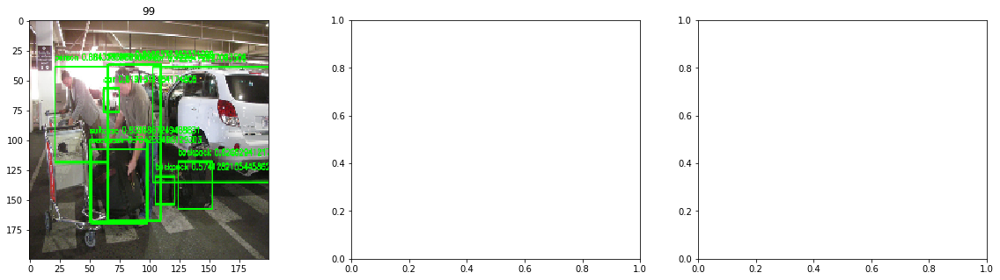

In [29]:
error=0
count=0
import pandas as pd
from copy import copy, deepcopy
from tqdm import tqdm,trange
result_df=pd.DataFrame({},columns=['class','iou','correct','True','img','boxx1','boxy1','boxx2','boxy2','conf'])
ind_loc=0
total_true_per_class={}
for _class in LABELS:
        total_true_per_class[_class]=0

if not os.path.exists('input/ground-truth'):
    os.mkdir('input/ground-truth')
if not os.path.exists('input/detection-results'):
    os.mkdir('input/detection-results')
pred_dicts=[]
for i in trange(0,5000):
  count+=1
  if test_on_test==True:
     sample=test_sample[i]
     image = cv2.imread('D:/COCO/test2017/'+sample['file_name'])
  if test_on_val==True:
     sample=valid_data[i]
     image = cv2.imread('D:/COCO/val2017/'+sample['filename'])
  image_h,image_w,_=image.shape
  input_image = cv2.resize(image, (IMAGE_W, IMAGE_H))
  input_image = input_image / 255.
  input_image = np.expand_dims(input_image, 0)
  netout = model.predict(input_image)
  
  if anc_box==True:
    pred_labels = decode_netout_anc(netout[0], 
                        obj_threshold=0.30,
                        nms_threshold=.90,
                        anchors=ANCHORS, 
                        nb_class=CLASS)
  if test_server==True:
  
      for pred_box in pred_labels:
          _x= pred_box[0]
          _y= pred_box[1]
          _width=(pred_box[2]-_x)
          _height=(pred_box[3]-_y)
          _class=list(_LABELS.keys())[int(pred_box[5])]
          pred={ 
              "image_id": int(sample['id']), 
              "category_id": int(_class), 
              "bbox": [_x*image_w,_y*image_h,_width*image_w,_height*image_h], 
              "score": float(pred_box[4]),
          }
          true_labels=None
          pred_dicts.append(pred)
      
  if calc_map==True: 
      true_labels=sample['object']
    
      true_lb={}
      pred_lb={}
      for lbl in LABELS:
           true_lb[lbl]=[]
           pred_lb[lbl]=[]
      f=open('input/ground-truth/'+str(i)+'.txt','w')
      str_true=''
      for lbl in true_labels:
              [name,xmin,ymin,xmax,ymax]=list(lbl.values())
              true_lb[name].append([(xmin),(ymin), (xmax),(ymax)])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_true+=str(name)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_true)
      f.close()

      f=open('input/detection-results/'+str(i)+'.txt','w')
      str_pred=''
      for box in pred_labels: 
              [xmin,ymin,xmax,ymax,conf,_name]=box
              name=LABELS[int(_name)]
              pred_lb[name].append([(xmin),(ymin), (xmax),(ymax),conf])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_pred+=str(name)+' '+str(conf)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_pred)
      f.close()
           

      for _class in LABELS:
                for true_box in true_lb[_class]:
                    total_true_per_class[_class]+=1
                for pred_box in pred_lb[_class]:
                    _max_iou=0
                    for _ind,true_box in enumerate(true_lb[_class]):
                        _iou= IOU(true_box,pred_box[:4])
                        if _iou>=_max_iou:
                                _max_iou=_iou

                    result_df.loc[ind_loc,['class','iou','True','img','boxx1','boxy1','boxx2','boxy2','conf']]=[_class,_max_iou,1.0,i,pred_box[0],pred_box[1],pred_box[2],pred_box[3],pred_box[4]]
                    if _max_iou>=0.5:
                            result_df.loc[ind_loc,'correct']=1
                    else :
                            result_df.loc[ind_loc,'correct']=0
                    ind_loc+=1
            
       
  image = draw_boxes_1(image, pred_labels, LABELS,true_labels)
  
  if i<100:
      _image=cv2.resize(image,(200,200))
      if i%3==0 :fig,axes=plt.subplots(nrows=1,ncols=3,figsize=(20,5))  
      axes[i%3].imshow(_image[:,:,::-1])
      axes[i%3].set_title(str(i))#+','+str(_ious))
      if i%3==3-1 :plt.show()
  

In [30]:
result_df.loc[:50]

,class,iou,correct,True,img,boxx1,boxy1,boxx2,boxy2,conf
0,person,0.411473,0,1,0,0.682088,0.381344,0.751888,0.700266,0.70545
1,chair,0.782468,1,1,0,0.457589,0.504099,0.568153,0.746126,0.755331
2,chair,0.522148,1,1,0,0.612717,0.509466,0.690921,0.716818,0.663695
3,potted plant,0.37946,0,1,0,0.342894,0.407094,0.412454,0.499278,0.506046
4,potted plant,0,0,1,0,0.532733,0.4056,0.581294,0.526061,0.402301
5,dining table,0.442142,0,1,0,0.484615,0.501248,0.616216,0.735145,0.335832
6,tv,0.816661,1,1,0,0.00406636,0.376013,0.254009,0.630564,0.849766
7,tv,0.872778,1,1,0,0.875719,0.490115,1.00021,0.690144,0.759653
8,clock,0.708066,1,1,0,0.694596,0.286539,0.719716,0.33464,0.566168
9,vase,0.78814,1,1,0,0.848669,0.723636,0.919085,0.931942,0.562672


In [31]:
f=open('val2017_detection_yolo_results.json','w')
json.dump(pred_dicts,f)
f.close()

In [32]:
!python map.py

77.12% = airplane AP 
5.90% = apple AP 
16.74% = backpack AP 
17.13% = banana AP 
52.30% = baseball-bat AP 
42.74% = baseball-glove AP 
73.52% = bear AP 
63.46% = bed AP 
30.54% = bench AP 
39.20% = bicycle AP 
40.12% = bird AP 
35.44% = boat AP 
17.31% = book AP 
35.99% = bottle AP 
38.06% = bowl AP 
39.76% = broccoli AP 
69.10% = bus AP 
24.13% = cake AP 
37.34% = car AP 
0.14% = carrot AP 
76.51% = cat AP 
34.98% = cell-phone AP 
35.45% = chair AP 
65.04% = clock AP 
47.40% = couch AP 
48.60% = cow AP 
36.47% = cup AP 
31.69% = dining-table AP 
60.76% = dog AP 
23.14% = donut AP 
65.80% = elephant AP 
67.67% = fire-hydrant AP 
30.28% = fork AP 
60.66% = frisbee AP 
64.85% = giraffe AP 
4.55% = hair-drier AP 
14.97% = handbag AP 
57.42% = horse AP 
2.40% = hot-dog AP 
67.74% = keyboard AP 
37.67% = kite AP 
12.05% = knife AP 
63.06% = laptop AP 
56.98% = microwave AP 
49.66% = motorcycle AP 
71.95% = mouse AP 
6.75% = orange AP 
56.57% = oven AP 
57.28% = parking-meter AP 
53.85% = p

In [33]:
def get_average_precision(res_class,_class):
    total_true=total_true_per_class[_class]
    #total_true=counts[_class]
    res_class['precision']=0
    res_class['recall']=0
    right=0
    for i in range(len(res_class)):
        if res_class.loc[i,'correct']==1 : right+=1
        res_class.loc[i,'precision']=right/(i+1)
        res_class.loc[i,'recall']=right/total_true
        
    AP=0
    res_class['auc']=res_class.precision.diff()
    indexes=res_class[res_class['auc']< 0.0].index.values-1
    res_class['new']=res_class.recall.diff()
    res_class['new']=res_class['new']*res_class.precision
    
    for i,ind in enumerate(indexes[:-1]):
        _precision=res_class.loc[indexes[i+1],'precision']
        delta_recall=abs(res_class.loc[indexes[i+1],'recall']-res_class.loc[indexes[i],'recall'])
        AP+=_precision*delta_recall
    return (AP),res_class


In [34]:
counts=result_df['class'].value_counts()
res_grp=result_df.groupby('class')
mAP=0
log_dfs={}
APS={}
for label in LABELS:
  try:
    res_class=res_grp.get_group(label).reset_index(drop=True)
    res_class=res_class.sort_values(by='conf',ascending=False).reset_index(drop=True)
    AP,log_df=get_average_precision(res_class,label)
    mAP+=AP*counts[label]
    print(label,AP,counts[label])
    log_dfs[label]=log_df
    APS[label]=AP
  except:0
mAP=mAP/counts.sum()
APS['mAP']=mAP
print('mAP:',mAP)

person 0.43609164109965953 6581
bicycle 0.17374161090879706 147
car 0.2941022511331063 907
motorcycle 0.23858291588134445 196
airplane 0.3116136231042222 122
bus 0.5079715534552547 228
train 0.628437076363219 158
truck 0.23121163635408573 222
boat 0.2316074900419994 197
traffic light 0.195462370665632 265
fire hydrant 0.09195278998901414 76
stop sign 0.18528110438961856 60
parking meter 0.39350763807285544 41
bench 0.24360605403692281 202
bird 0.2448463672603966 312
cat 0.6499301387991681 186
dog 0.5278694836724885 195
horse 0.47974157400462347 209
sheep 0.3456270620276784 250
cow 0.35574307508988967 205
elephant 0.5192648328815292 190
bear 0.2277960036994102 73
zebra 0.28507136007949196 180
giraffe 0.19801774328901775 154
backpack 0.08976673087057545 124
umbrella 0.30579430695619414 235
handbag 0.08481048508316424 117
tie 0.315767291684747 149
suitcase 0.24326898203208935 145
frisbee 0.5439848318539783 114
skis 0.21179644280663298 128
snowboard 0.2612634839412336 43
sports ball 0.2712

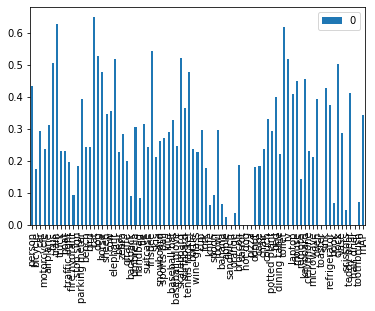

In [23]:
import pickle
f=open(root+exp_name+'mAP','wb')
pickle.dump(APS,f)
f.close()
AP_df=pd.DataFrame(APS,index=[0]).transpose()
AP_df.plot.bar()

In [ ]:
for key in log_dfs.keys():
    log_df=log_dfs[key]
    plt.plot(log_df.recall,log_df.precision)
    plt.title(key+' recall vs precision')
    plt.savefig(root+exp_name+'prec_recall.png')
    plt.show()

In [ ]:
log_dfs['person'].tail(50)#.correct.sum()/total_true_per_class['person']#len(log_dfs['person'])

In [ ]:
#model.save(root+exp_name+'70.h5')

### Extra Debug

In [ ]:
GRID_W=7
GRID_H=7
BATCH_SIZE=10
cell_x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))
cell_y = tf.transpose(cell_x, (0,2,1,3,4))
cell_grid = tf.tile(tf.concat([cell_x,cell_y], -1), [BATCH_SIZE, 1, 1, 5, 1])

#pred_xy = tf.sigmoid(y_pred[..., :2]) + cell_grid
#pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
sess=tf.Session()
x,y,grid=sess.run([cell_x,cell_y,cell_grid])

In [ ]:
x.shape,y.shape,grid.shape

In [ ]:
z=np.concatenate([x,y],-1)
z.shape

In [ ]:
y_true=np.ones((7,7,10))
ob_mask= tf.expand_dims(y_true[..., 4], axis=-1)
sess=tf.Session()
_mask=sess.run(ob_mask)
_mask.shape,y_true[..., 4].shape

In [ ]:
import numpy as np
import tensorflow as tf
label=np.ones((7,7,15))
label[...,14]=5
true_box=np.argmax(label[...,10:],-1)

In [ ]:
wts=np.ones((10))
wts[3:7]=9
res=tf.gather(wts,true_box)
sess=tf.Session()
ret=sess.run(res)
ret

In [ ]:
ret.shape,label[...,4:].shape,label[...,5:].shape

In [ ]:
import tensorflow as tf
X=tf.zeros((3,3))
Y=tf.equal(X,1)
A=tf.where(Y,X,tf.ones_like(X))
sess=tf.Session()
Z=sess.run(A)
Z 

### Extra functions

In [ ]:
import csv

def read_data(dataset):
  f=open(dataset+'/label.csv')
  file=csv.reader(f,delimiter=',')
  data=[]
  i=0
  sc=416.0
  for line in file:
      dt=line
      H=dt[0]
      W=dt[1]
      xmin=(float(dt[2]))/sc
      ymin=(float(dt[3]))/sc
      xmax=(float(dt[4]))/sc
      ymax=(float(dt[5]))/sc

      output={
          'filename':dataset+'/images/'+str(i)+'.jpg',
          'height':H,
          'width':W,
          'object':[{'name':'None',
          'xmin':xmin*IMAGE_W,
          'ymin':ymin*IMAGE_H,
          'xmax':xmax*IMAGE_W,
          'ymax':ymax*IMAGE_H}]
          }

      data.append(output)
      i=i+1
  return data
